## Assignment 3: Generative Model

# Part I - Generative Adversarial Networks (GANs)
So far in DS6050, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__.
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661).

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

C:\Users\zlism\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy.


**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1].

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data

        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B))

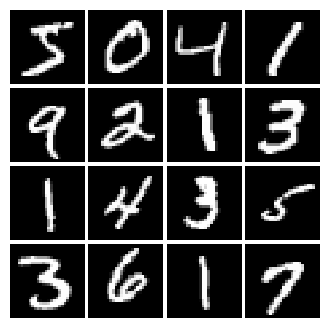

In [3]:
# show a batch
mnist = MNIST(batch_size=16)
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.

    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU

    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return tf.maximum(x, alpha*x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.

    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate

    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform(shape =[batch_size,dim], minval=-1,maxval=1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")

test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1

The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [16]:
def discriminator():
    """Compute discriminator score for a batch of input images.

    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]

    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Dense(256, input_shape=(784,)),
        tf.keras.layers.LeakyReLU(alpha=0.01),

        # Fully connected layer with output size 256
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(alpha=0.01),

        # Fully connected layer with output size 1
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [17]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')

test_discriminator()

Correct number of parameters in discriminator.


C:\Users\zlism\anaconda3\Lib\site-packages\keras\src\layers\activations\leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [8]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.

    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]

    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
     # Fully connected layer with output size 1024
        tf.keras.layers.Dense(1024, input_shape=(noise_dim,)),
        tf.keras.layers.ReLU(),
        
        # Fully connected layer with output size 1024
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        
        # Fully connected layer with output size 784
        tf.keras.layers.Dense(784),
        tf.keras.layers.Activation('tanh')


        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [9]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')

test_generator()

Correct number of parameters in generator.


C:\Users\zlism\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [10]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.

    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    
    # Loss for real data (target is 1 for real data)
    real_loss = cross_entropy(tf.ones_like(logits_real), logits_real)
    
    # Loss for fake data (target is 0 for fake data)
    fake_loss = cross_entropy(tf.zeros_like(logits_fake), logits_fake)
    
    # Total discriminator loss
    loss = real_loss + fake_loss

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.

    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    
    loss = cross_entropy(tf.ones_like(logits_fake), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [11]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 0


In [12]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 0


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z).

In [13]:
# TODO: create an AdamOptimizer for D_optimizer and G_optimizer
def get_optimizers(learning_rate=1e-3, beta1=0.5):
    """Create optimizer for GAN training.

    Inputs:
    - learning_rate: learning rate to use for both optimizer
    - beta1: beta1 parameter for both optimizer (first moment decay)

    Returns:
    - D_optimizer: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_optimizer: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_optimizer = None
    G_optimizer = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    D_optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    G_optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_optimizer, G_optimizer

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other.

In [14]:
# a giant helper function
def run_a_gan(D, G, D_optimizer, G_optimizer, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.

    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_optimizer: an Optimizer for Discriminator
    - G_optimizer: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)

    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)
                D_optimizer.apply_gradients(zip(d_gradients, D.trainable_variables))

            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)
                G_optimizer.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1

    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.337, G:0.7377
Instructions for updating:
Use tf.identity with explicit device placement instead.


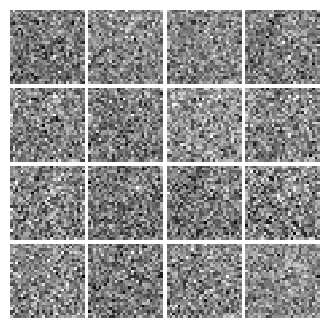

Epoch: 0, Iter: 20, D: 0.5842, G:0.9771


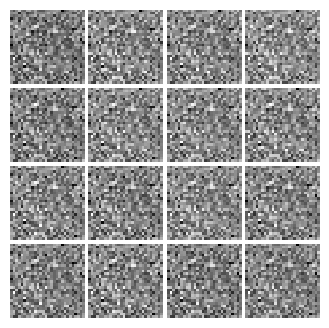

Epoch: 0, Iter: 40, D: 0.4398, G:1.117


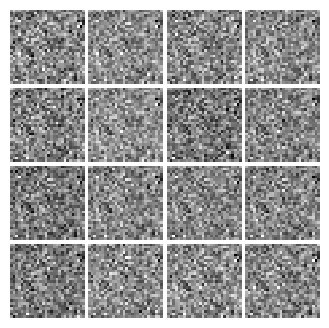

Epoch: 0, Iter: 60, D: 2.297, G:3.626


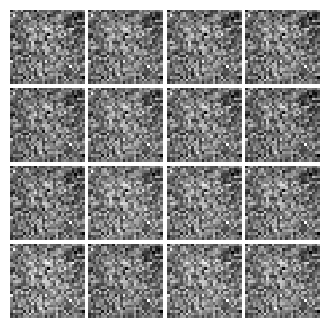

Epoch: 0, Iter: 80, D: 1.59, G:1.095


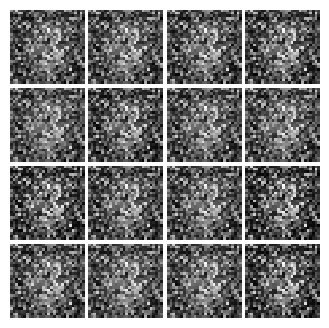

Epoch: 0, Iter: 100, D: 1.246, G:1.778


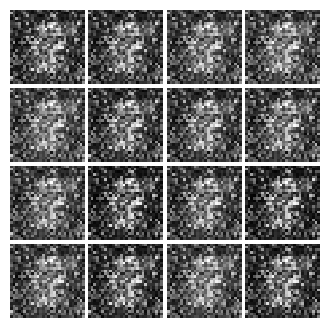

Epoch: 0, Iter: 120, D: 1.451, G:0.9919


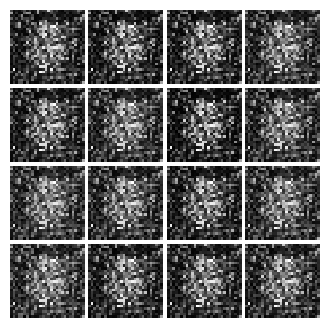

Epoch: 0, Iter: 140, D: 1.711, G:0.829


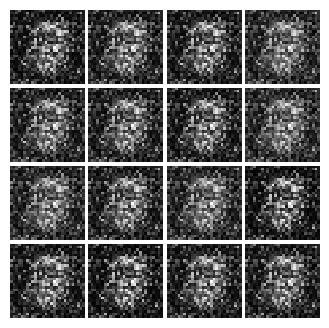

Epoch: 0, Iter: 160, D: 1.618, G:0.6485


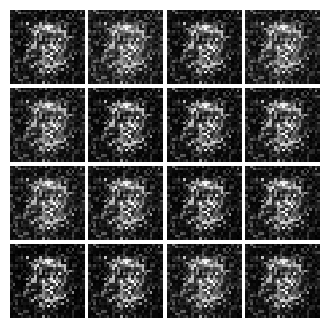

Epoch: 0, Iter: 180, D: 0.9797, G:1.515


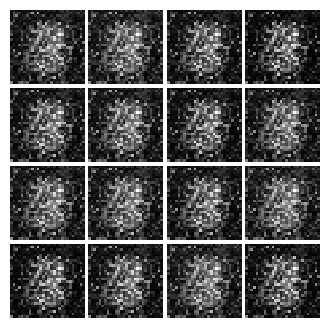

Epoch: 0, Iter: 200, D: 1.362, G:1.226


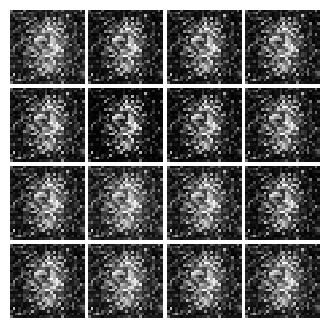

Epoch: 0, Iter: 220, D: 1.268, G:0.9094


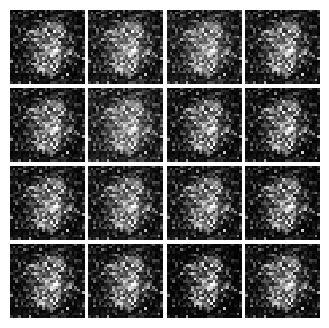

Epoch: 0, Iter: 240, D: 1.003, G:1.285


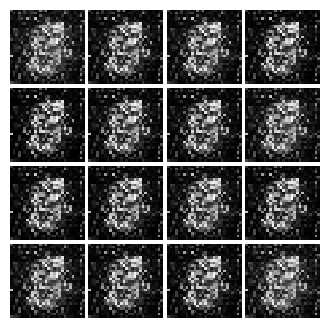

Epoch: 0, Iter: 260, D: 0.8785, G:1.514


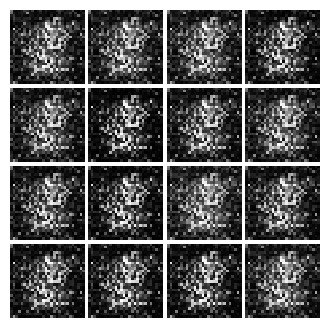

Epoch: 0, Iter: 280, D: 1.165, G:1.476


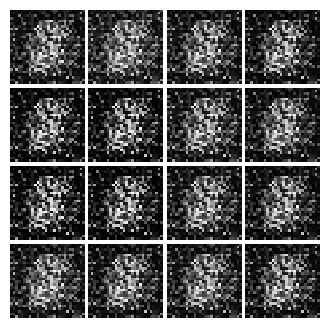

Epoch: 0, Iter: 300, D: 1.518, G:1.28


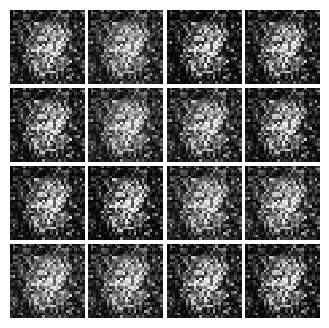

Epoch: 0, Iter: 320, D: 1.62, G:0.473


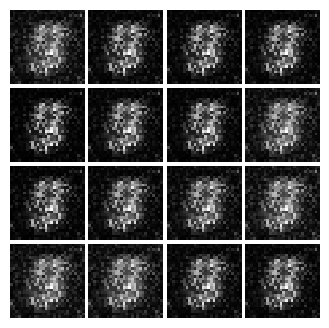

Epoch: 0, Iter: 340, D: 1.31, G:1.678


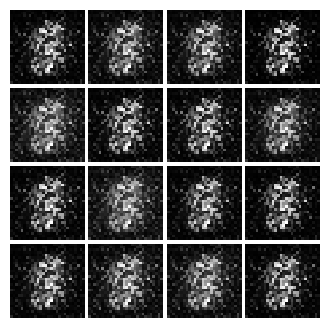

Epoch: 0, Iter: 360, D: 1.104, G:1.105


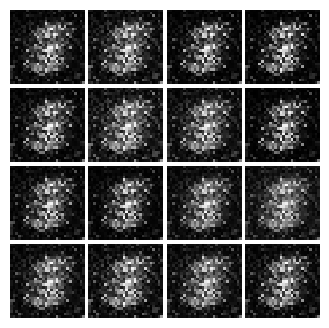

Epoch: 0, Iter: 380, D: 0.89, G:1.105


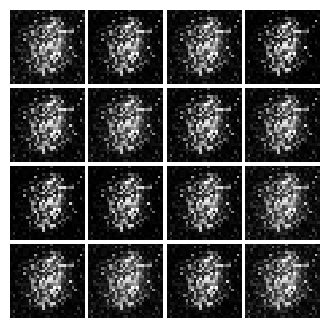

Epoch: 0, Iter: 400, D: 1.432, G:1.013


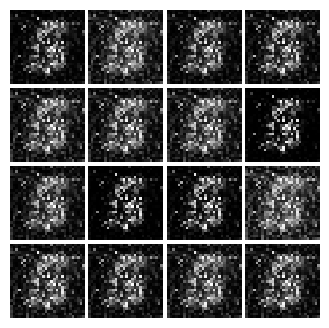

Epoch: 0, Iter: 420, D: 1.621, G:0.8279


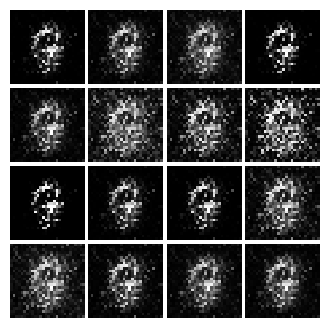

Epoch: 0, Iter: 440, D: 1.267, G:0.9972


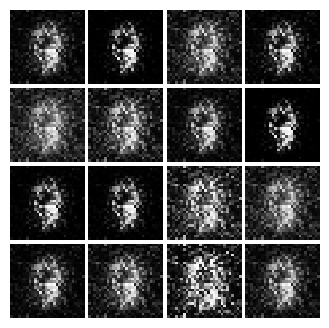

Epoch: 0, Iter: 460, D: 1.206, G:0.3488


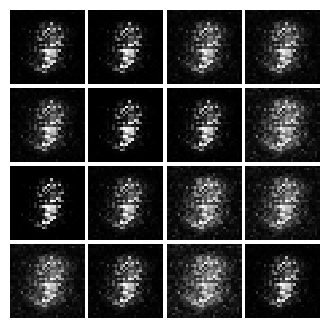

Epoch: 1, Iter: 480, D: 1.436, G:0.7261


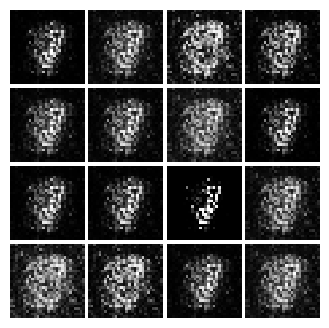

Epoch: 1, Iter: 500, D: 1.009, G:1.343


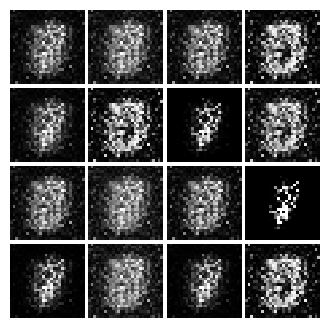

Epoch: 1, Iter: 520, D: 0.9825, G:1.158


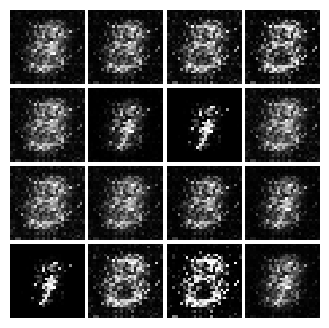

Epoch: 1, Iter: 540, D: 1.162, G:0.9362


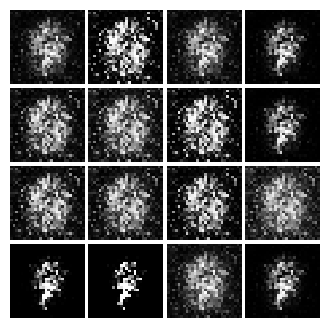

Epoch: 1, Iter: 560, D: 1.046, G:1.272


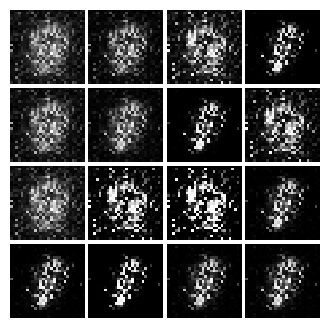

Epoch: 1, Iter: 580, D: 1.205, G:1.116


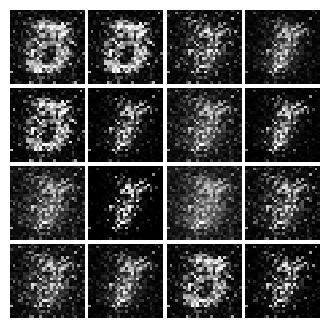

Epoch: 1, Iter: 600, D: 1.429, G:1.222


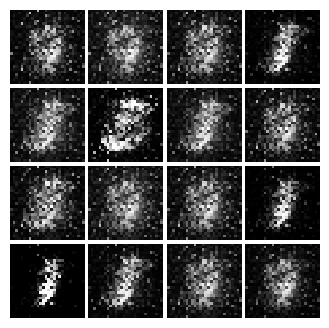

Epoch: 1, Iter: 620, D: 1.371, G:0.8489


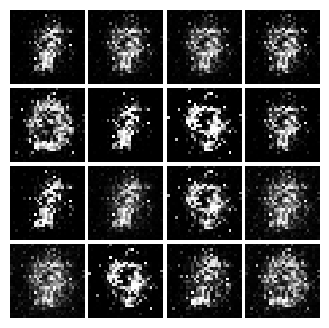

Epoch: 1, Iter: 640, D: 1.168, G:1.41


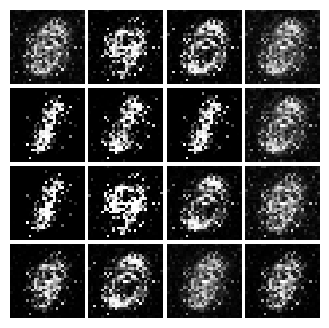

Epoch: 1, Iter: 660, D: 1.418, G:0.8657


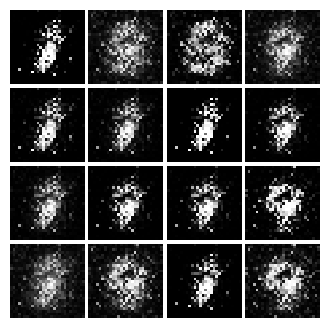

Epoch: 1, Iter: 680, D: 0.9547, G:1.53


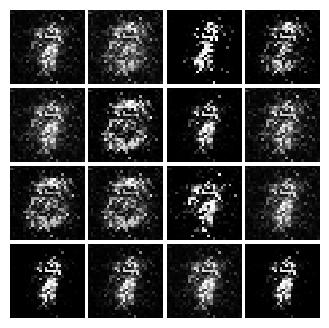

Epoch: 1, Iter: 700, D: 1.243, G:1.666


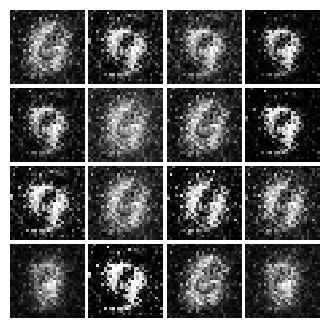

Epoch: 1, Iter: 720, D: 0.8309, G:1.724


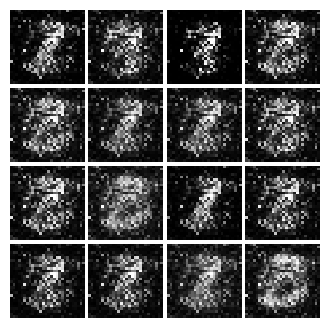

Epoch: 1, Iter: 740, D: 1.401, G:1.275


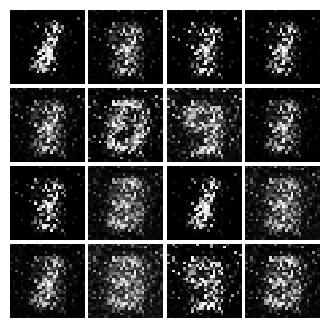

Epoch: 1, Iter: 760, D: 1.304, G:1.363


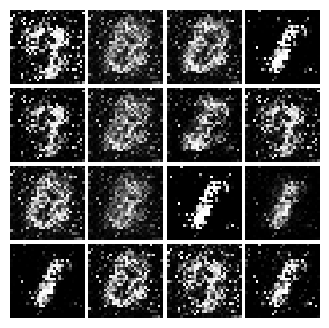

Epoch: 1, Iter: 780, D: 0.8775, G:1.55


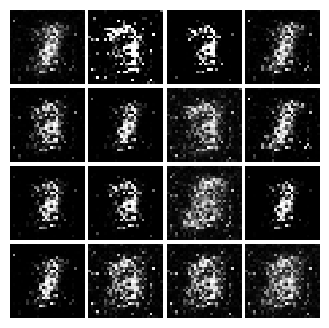

Epoch: 1, Iter: 800, D: 1.087, G:2.224


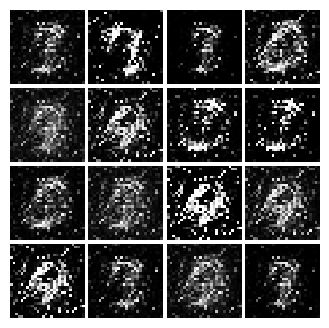

Epoch: 1, Iter: 820, D: 0.8816, G:1.929


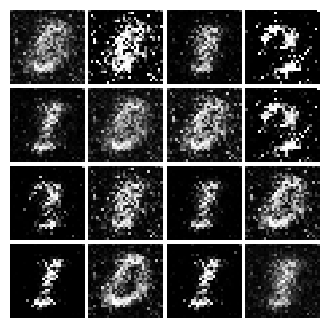

Epoch: 1, Iter: 840, D: 0.8912, G:1.43


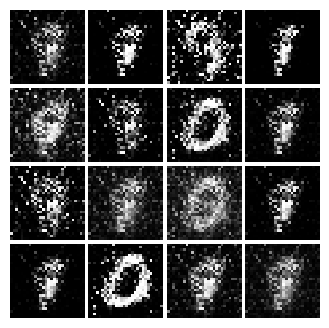

Epoch: 1, Iter: 860, D: 1.012, G:1.295


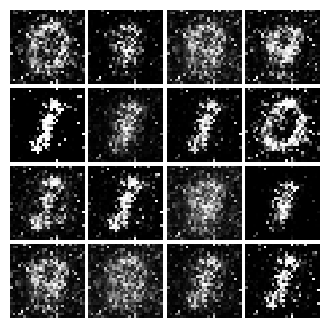

Epoch: 1, Iter: 880, D: 0.9871, G:1.722


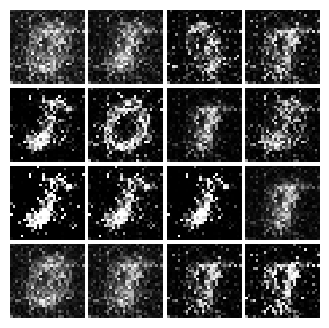

Epoch: 1, Iter: 900, D: 1.047, G:1.131


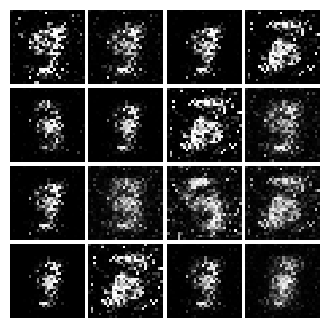

Epoch: 1, Iter: 920, D: 1.338, G:1.28


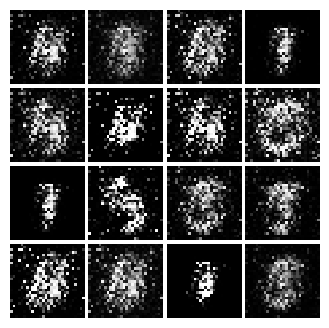

Epoch: 2, Iter: 940, D: 1.255, G:1.076


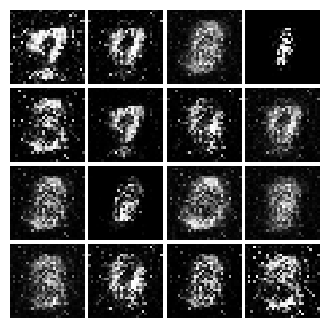

Epoch: 2, Iter: 960, D: 1.063, G:1.503


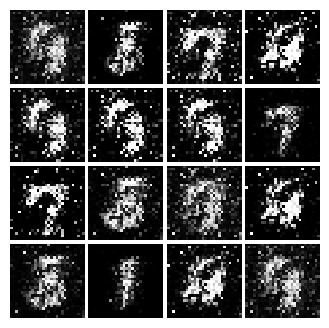

Epoch: 2, Iter: 980, D: 1.058, G:1.775


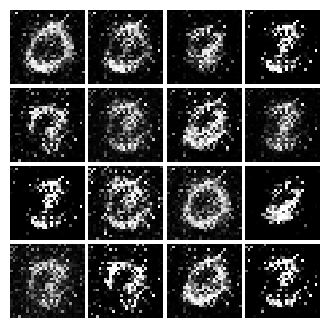

Epoch: 2, Iter: 1000, D: 1.111, G:1.176


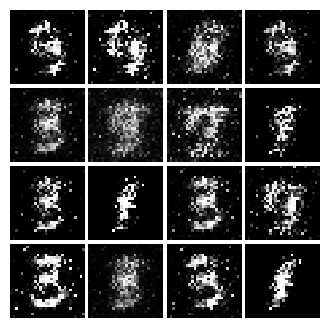

Epoch: 2, Iter: 1020, D: 1.595, G:1.369


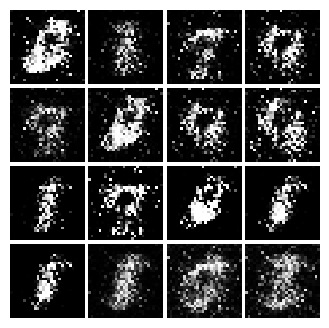

Epoch: 2, Iter: 1040, D: 0.8246, G:1.531


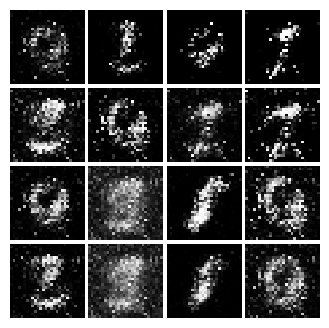

Epoch: 2, Iter: 1060, D: 1.816, G:2.044


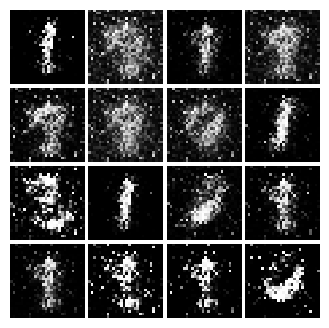

Epoch: 2, Iter: 1080, D: 1.2, G:1.053


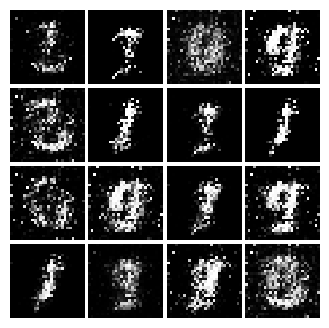

Epoch: 2, Iter: 1100, D: 1.358, G:1.195


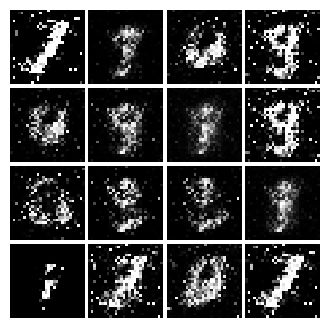

Epoch: 2, Iter: 1120, D: 1.119, G:1.082


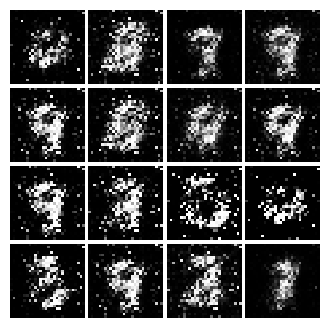

Epoch: 2, Iter: 1140, D: 1.153, G:1.35


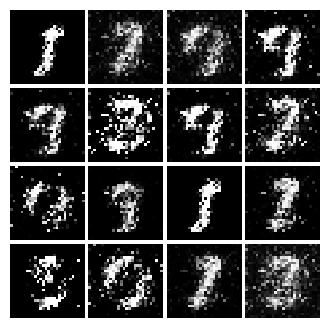

Epoch: 2, Iter: 1160, D: 0.9518, G:1.369


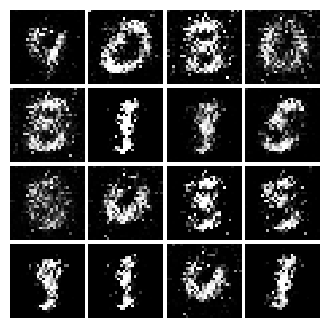

Epoch: 2, Iter: 1180, D: 1.257, G:0.9393


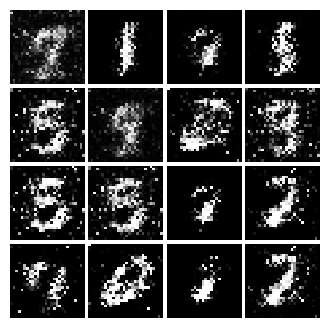

Epoch: 2, Iter: 1200, D: 1.099, G:1.11


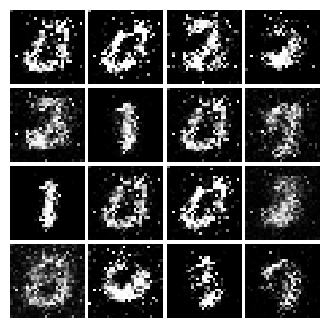

Epoch: 2, Iter: 1220, D: 1.031, G:2.008


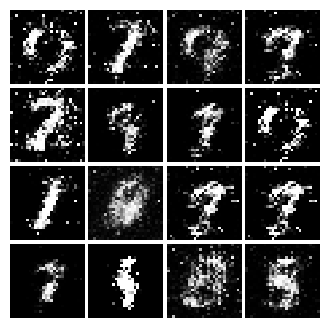

Epoch: 2, Iter: 1240, D: 1.265, G:0.9737


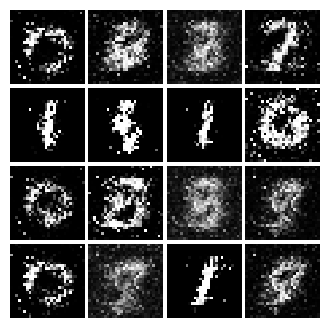

Epoch: 2, Iter: 1260, D: 1.146, G:2.11


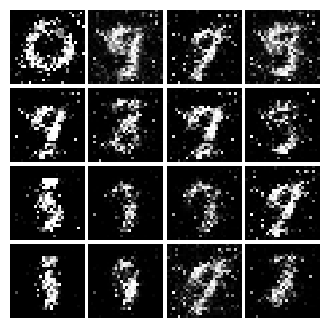

Epoch: 2, Iter: 1280, D: 1.231, G:0.9528


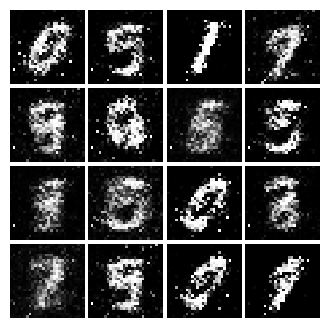

Epoch: 2, Iter: 1300, D: 1.345, G:1.393


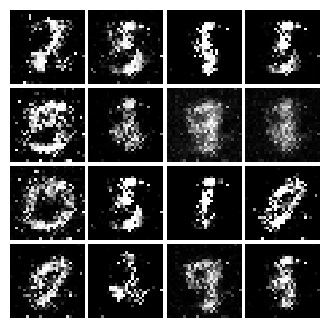

Epoch: 2, Iter: 1320, D: 1.35, G:1.162


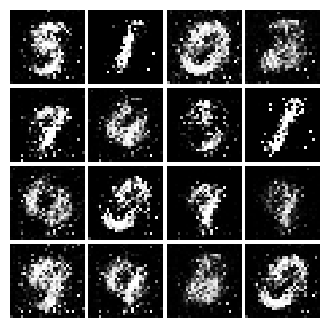

Epoch: 2, Iter: 1340, D: 1.352, G:1.207


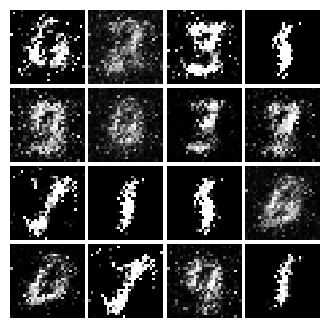

Epoch: 2, Iter: 1360, D: 1.161, G:1.027


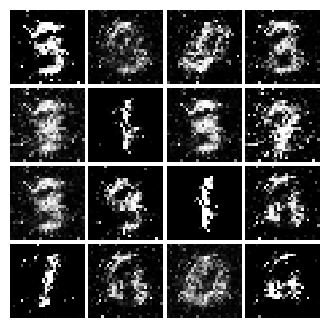

Epoch: 2, Iter: 1380, D: 1.111, G:1.11


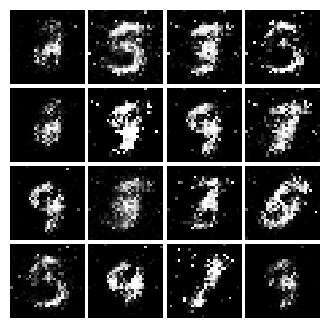

Epoch: 2, Iter: 1400, D: 1.408, G:0.835


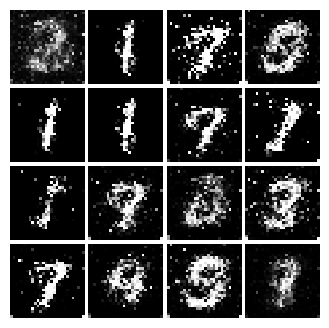

Epoch: 3, Iter: 1420, D: 1.081, G:1.149


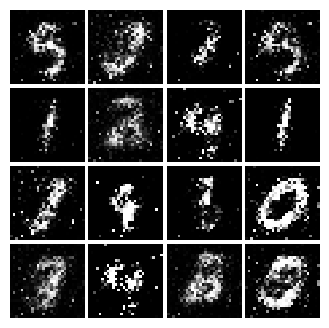

Epoch: 3, Iter: 1440, D: 1.142, G:0.9072


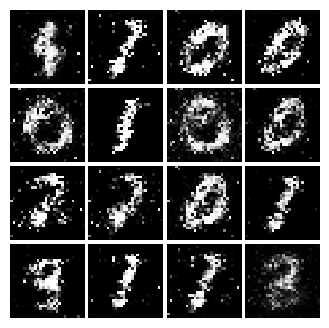

Epoch: 3, Iter: 1460, D: 1.34, G:1.0


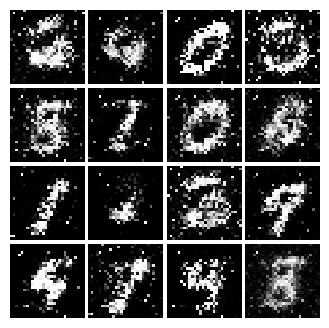

Epoch: 3, Iter: 1480, D: 1.103, G:0.8967


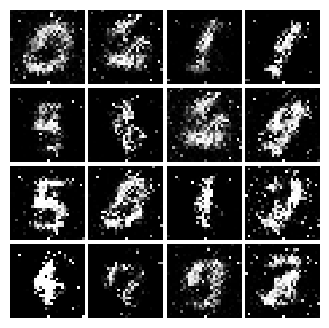

Epoch: 3, Iter: 1500, D: 1.238, G:1.577


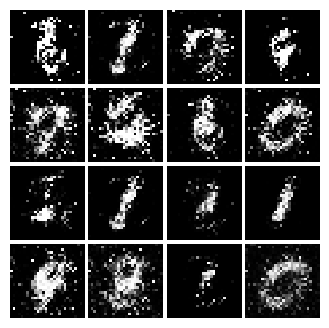

Epoch: 3, Iter: 1520, D: 1.291, G:2.04


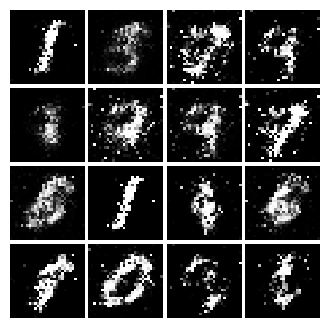

Epoch: 3, Iter: 1540, D: 1.141, G:1.019


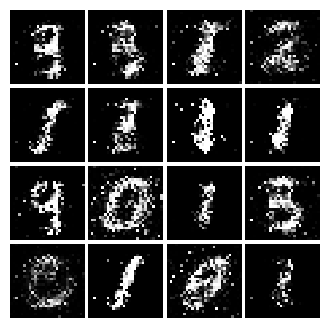

Epoch: 3, Iter: 1560, D: 1.196, G:1.204


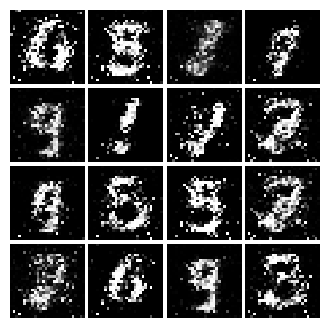

Epoch: 3, Iter: 1580, D: 1.338, G:1.16


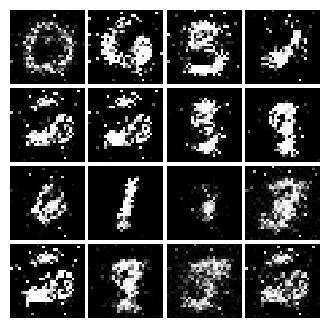

Epoch: 3, Iter: 1600, D: 1.372, G:1.38


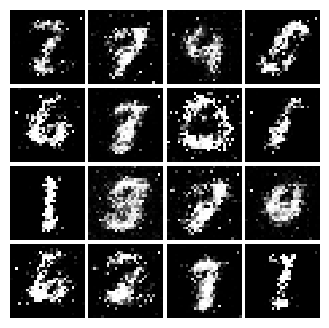

Epoch: 3, Iter: 1620, D: 1.211, G:0.8725


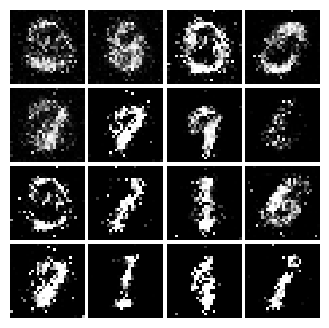

Epoch: 3, Iter: 1640, D: 1.251, G:0.6883


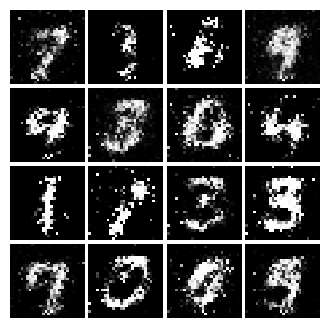

Epoch: 3, Iter: 1660, D: 1.046, G:1.217


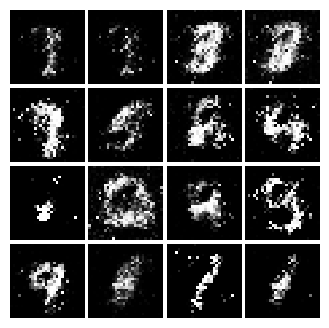

Epoch: 3, Iter: 1680, D: 1.071, G:1.461


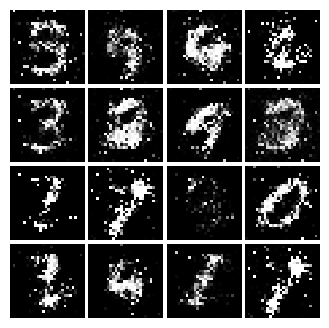

Epoch: 3, Iter: 1700, D: 1.228, G:1.12


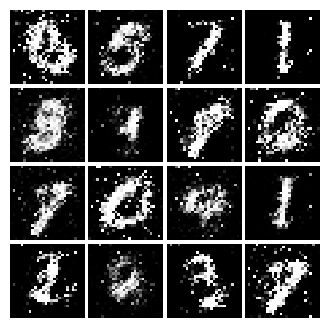

Epoch: 3, Iter: 1720, D: 1.201, G:0.8973


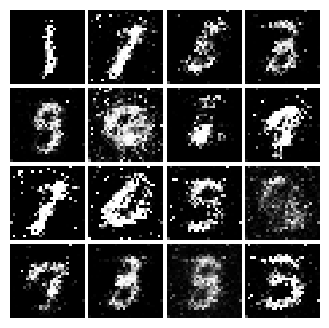

Epoch: 3, Iter: 1740, D: 1.14, G:0.9274


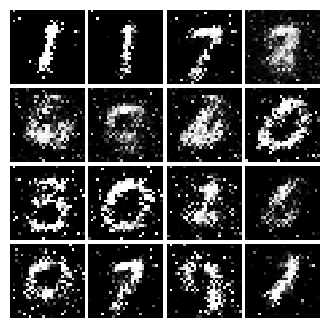

Epoch: 3, Iter: 1760, D: 1.155, G:0.9415


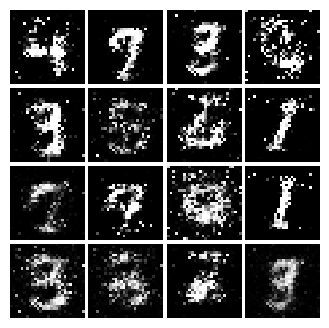

Epoch: 3, Iter: 1780, D: 1.186, G:0.8203


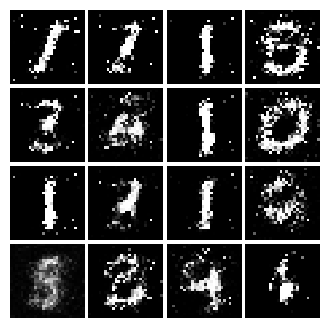

Epoch: 3, Iter: 1800, D: 1.213, G:0.864


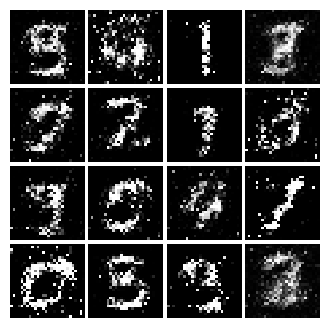

Epoch: 3, Iter: 1820, D: 0.9813, G:1.068


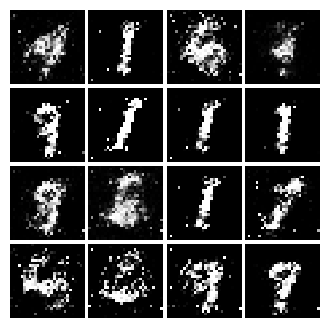

Epoch: 3, Iter: 1840, D: 1.33, G:1.47


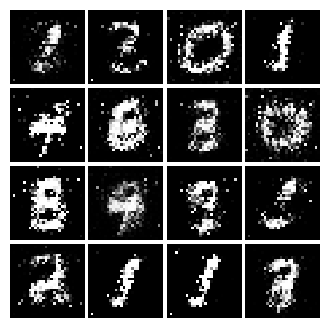

Epoch: 3, Iter: 1860, D: 1.117, G:1.045


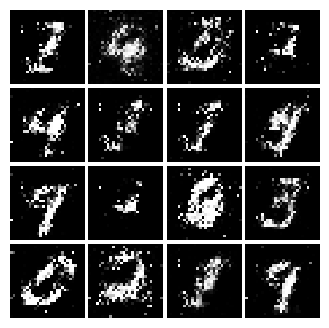

Epoch: 4, Iter: 1880, D: 1.169, G:1.095


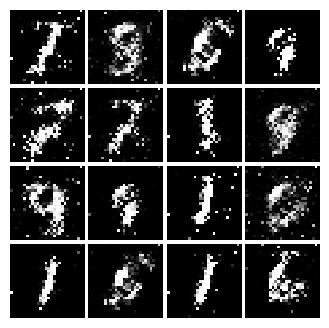

Epoch: 4, Iter: 1900, D: 1.359, G:0.8825


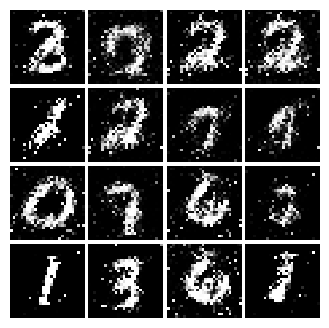

Epoch: 4, Iter: 1920, D: 1.207, G:0.9477


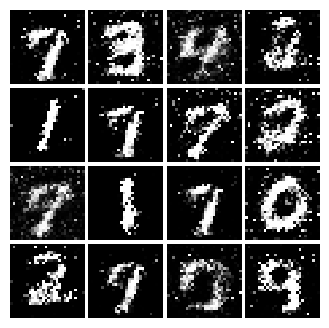

Epoch: 4, Iter: 1940, D: 1.232, G:0.8652


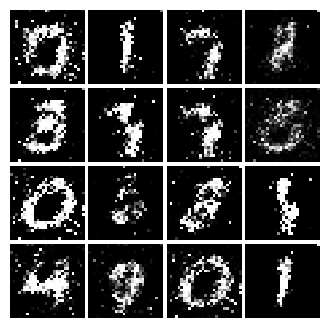

Epoch: 4, Iter: 1960, D: 1.29, G:0.9645


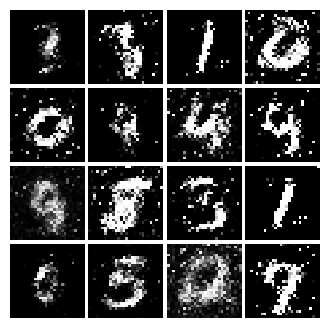

Epoch: 4, Iter: 1980, D: 1.278, G:1.099


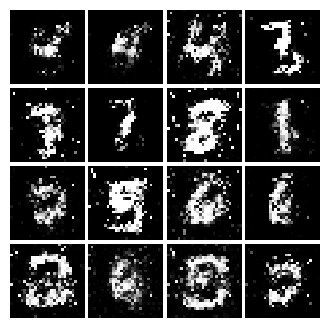

Epoch: 4, Iter: 2000, D: 1.312, G:1.012


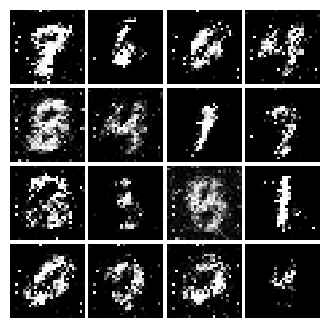

Epoch: 4, Iter: 2020, D: 1.283, G:0.8834


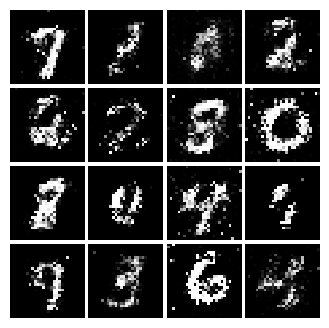

Epoch: 4, Iter: 2040, D: 1.351, G:0.8646


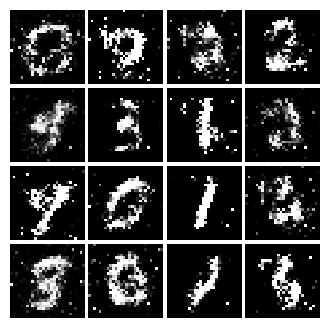

Epoch: 4, Iter: 2060, D: 1.223, G:1.082


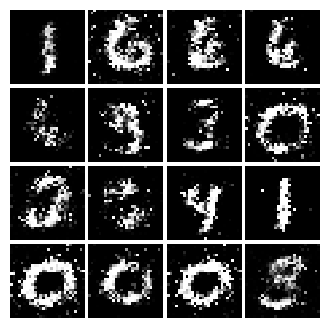

Epoch: 4, Iter: 2080, D: 1.289, G:0.8202


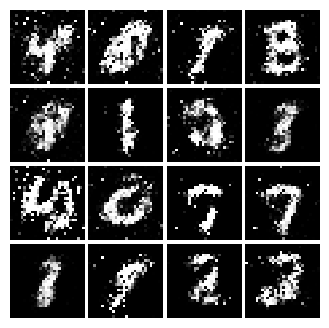

Epoch: 4, Iter: 2100, D: 1.293, G:0.8628


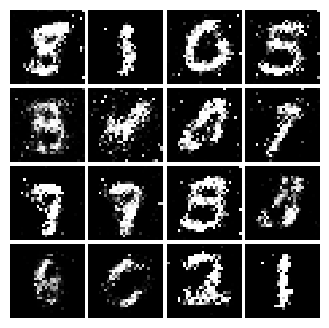

Epoch: 4, Iter: 2120, D: 1.352, G:0.8411


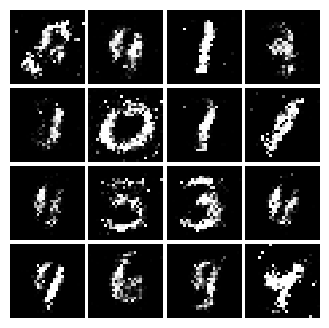

Epoch: 4, Iter: 2140, D: 1.239, G:1.039


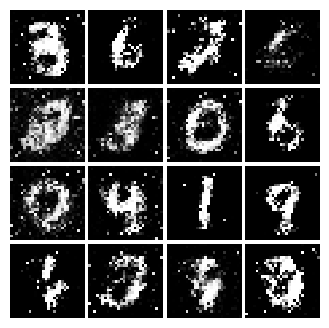

Epoch: 4, Iter: 2160, D: 1.369, G:0.8516


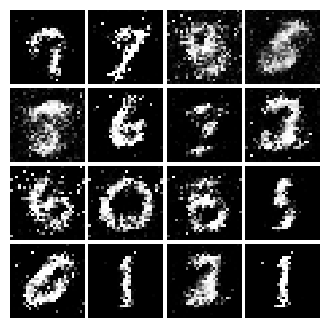

Epoch: 4, Iter: 2180, D: 1.173, G:1.029


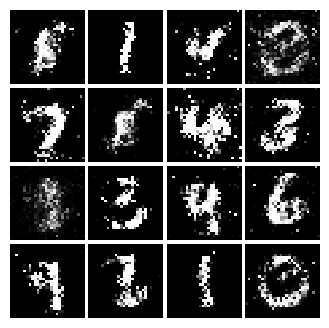

Epoch: 4, Iter: 2200, D: 1.26, G:0.8962


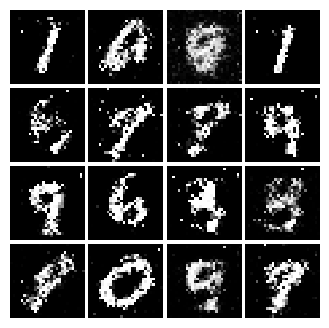

Epoch: 4, Iter: 2220, D: 1.19, G:1.189


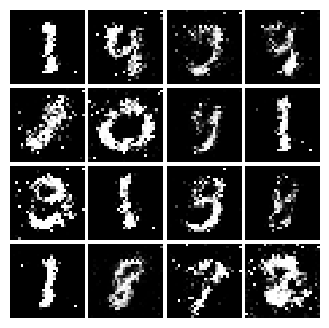

Epoch: 4, Iter: 2240, D: 1.261, G:0.9847


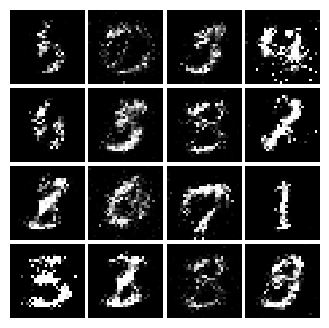

Epoch: 4, Iter: 2260, D: 1.274, G:1.111


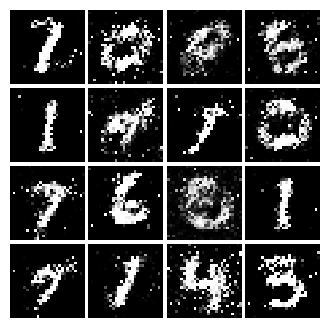

Epoch: 4, Iter: 2280, D: 1.213, G:1.07


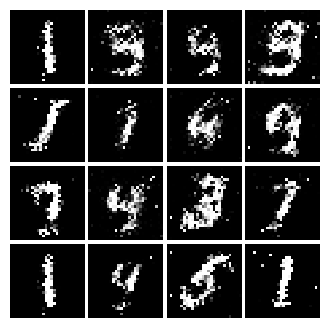

Epoch: 4, Iter: 2300, D: 1.303, G:0.9002


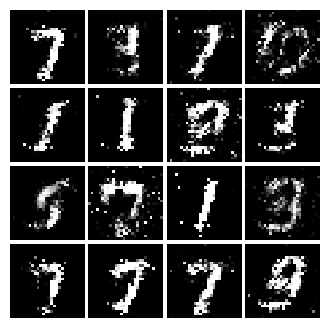

Epoch: 4, Iter: 2320, D: 1.23, G:0.9442


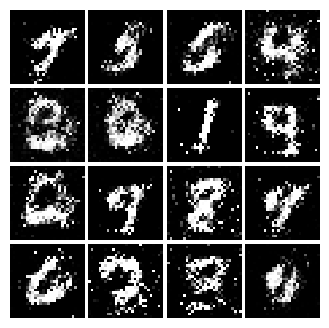

Epoch: 4, Iter: 2340, D: 1.267, G:1.154


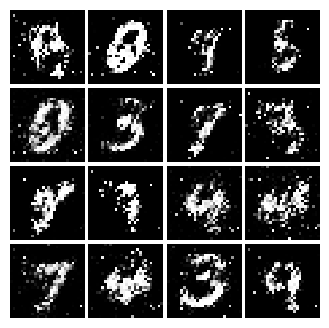

Epoch: 5, Iter: 2360, D: 1.198, G:0.8505


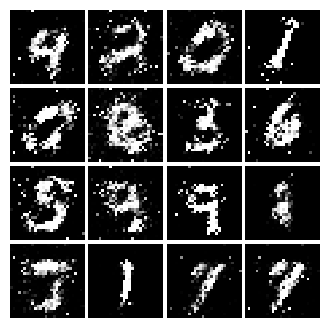

Epoch: 5, Iter: 2380, D: 1.282, G:0.9482


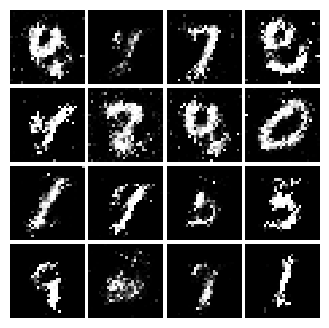

Epoch: 5, Iter: 2400, D: 1.366, G:0.9295


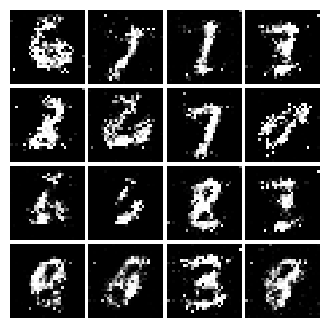

Epoch: 5, Iter: 2420, D: 1.204, G:0.8953


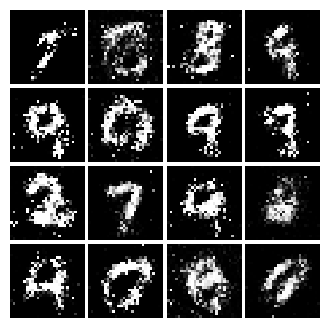

Epoch: 5, Iter: 2440, D: 1.317, G:0.9517


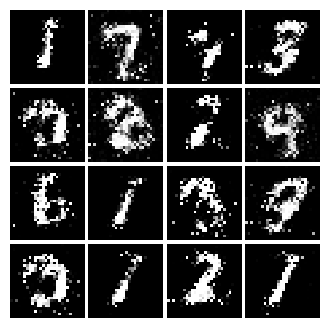

Epoch: 5, Iter: 2460, D: 1.148, G:0.9677


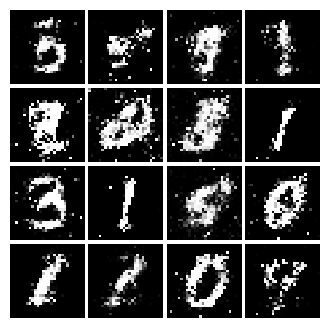

Epoch: 5, Iter: 2480, D: 1.239, G:0.9349


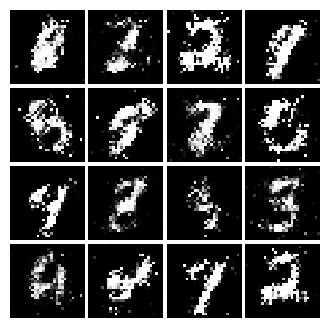

Epoch: 5, Iter: 2500, D: 1.213, G:0.9623


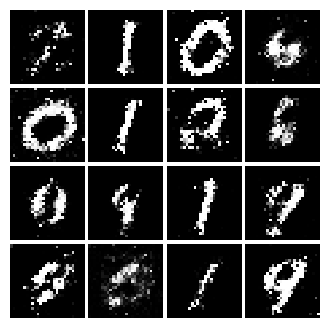

Epoch: 5, Iter: 2520, D: 1.403, G:1.003


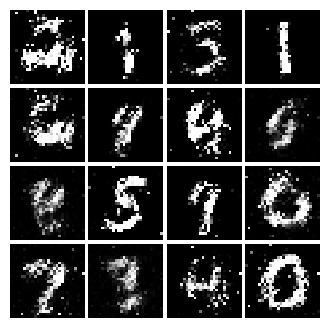

Epoch: 5, Iter: 2540, D: 1.267, G:0.8026


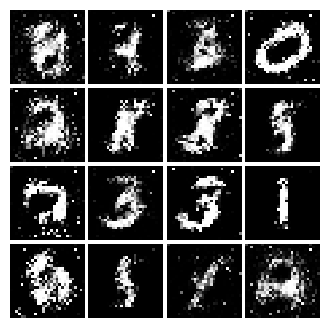

Epoch: 5, Iter: 2560, D: 1.317, G:0.8528


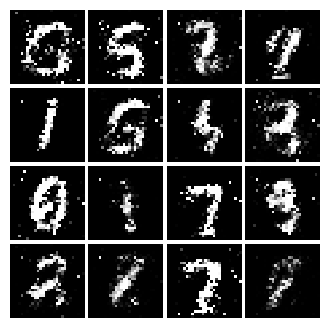

Epoch: 5, Iter: 2580, D: 1.293, G:0.8541


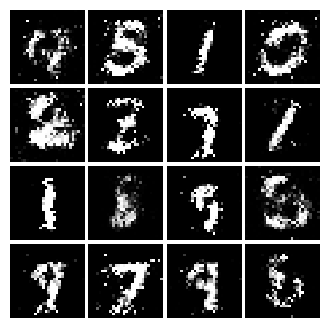

Epoch: 5, Iter: 2600, D: 1.412, G:0.8192


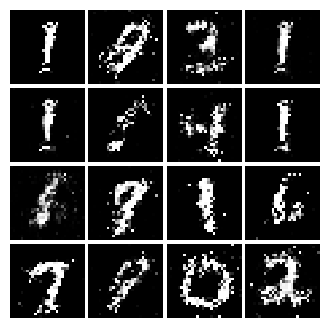

Epoch: 5, Iter: 2620, D: 1.275, G:0.8091


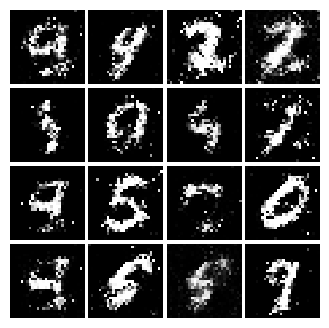

Epoch: 5, Iter: 2640, D: 1.276, G:0.8401


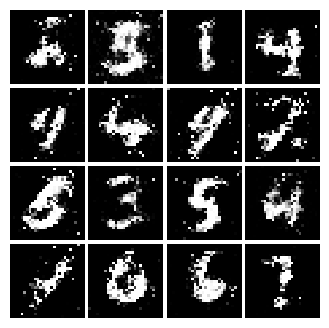

Epoch: 5, Iter: 2660, D: 1.25, G:0.874


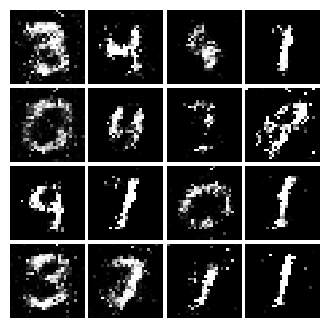

Epoch: 5, Iter: 2680, D: 1.238, G:0.7982


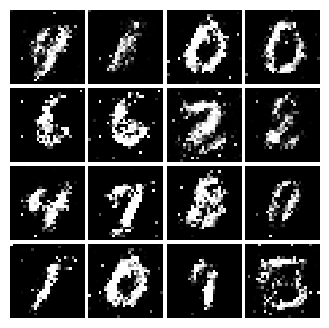

Epoch: 5, Iter: 2700, D: 1.374, G:0.7884


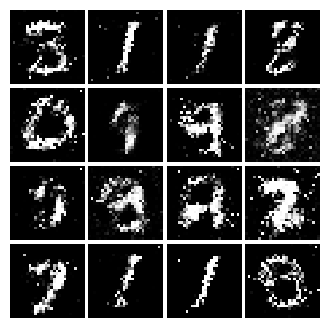

Epoch: 5, Iter: 2720, D: 1.314, G:0.8572


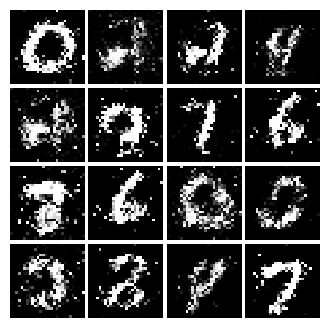

Epoch: 5, Iter: 2740, D: 1.256, G:0.9032


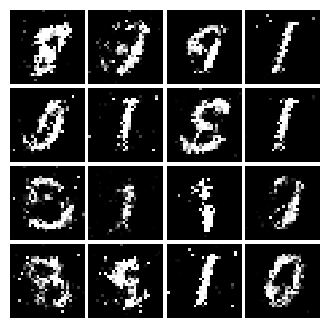

Epoch: 5, Iter: 2760, D: 1.35, G:0.8623


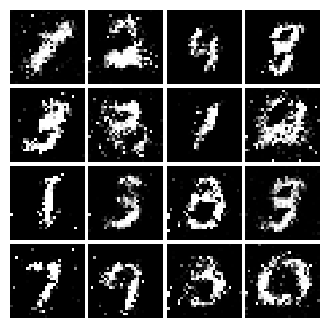

Epoch: 5, Iter: 2780, D: 1.3, G:0.9217


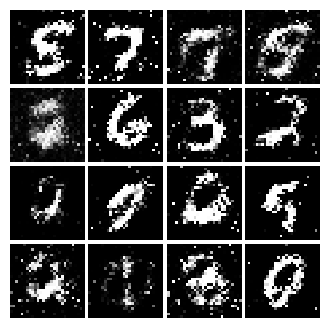

Epoch: 5, Iter: 2800, D: 1.275, G:0.9202


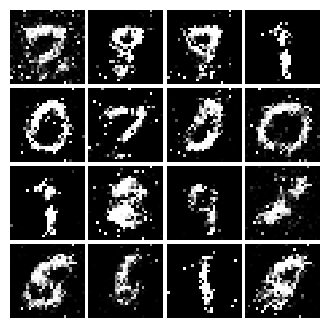

Epoch: 6, Iter: 2820, D: 1.256, G:0.8167


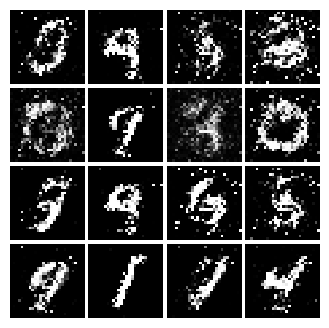

Epoch: 6, Iter: 2840, D: 1.297, G:0.8083


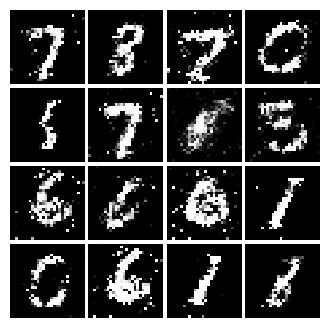

Epoch: 6, Iter: 2860, D: 1.299, G:0.8343


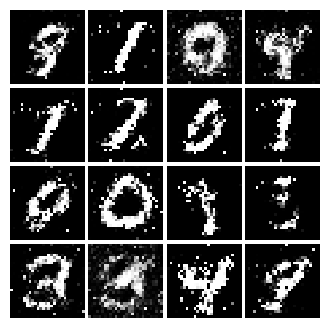

Epoch: 6, Iter: 2880, D: 1.352, G:0.8895


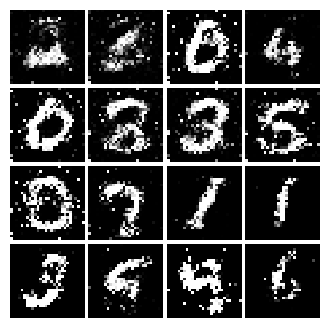

Epoch: 6, Iter: 2900, D: 1.391, G:0.9732


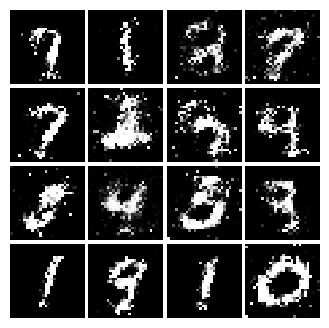

Epoch: 6, Iter: 2920, D: 1.355, G:0.9173


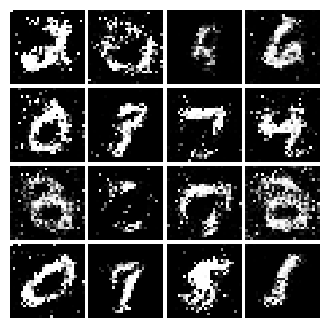

Epoch: 6, Iter: 2940, D: 1.266, G:0.844


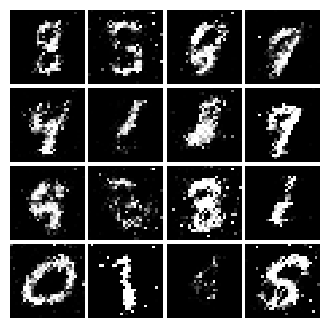

Epoch: 6, Iter: 2960, D: 1.312, G:0.7721


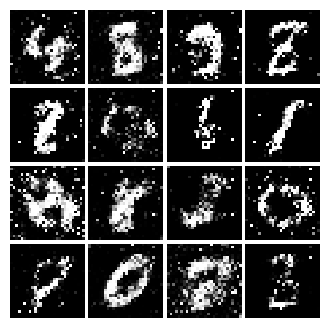

Epoch: 6, Iter: 2980, D: 1.279, G:0.937


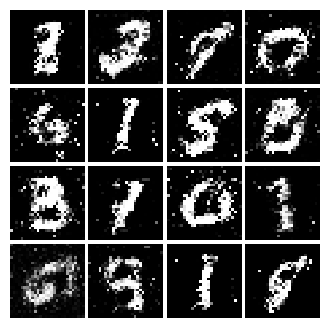

Epoch: 6, Iter: 3000, D: 1.372, G:0.7635


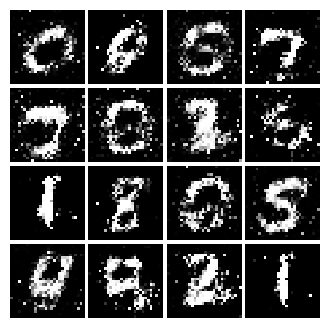

Epoch: 6, Iter: 3020, D: 1.312, G:0.8816


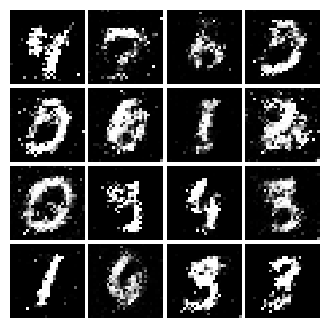

Epoch: 6, Iter: 3040, D: 1.309, G:0.7238


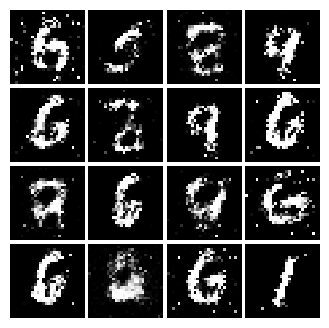

Epoch: 6, Iter: 3060, D: 1.294, G:0.8035


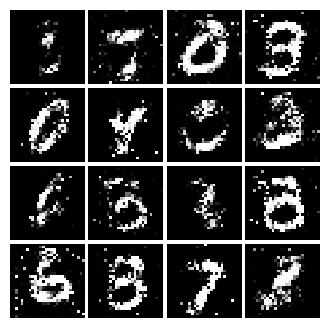

Epoch: 6, Iter: 3080, D: 1.384, G:0.8047


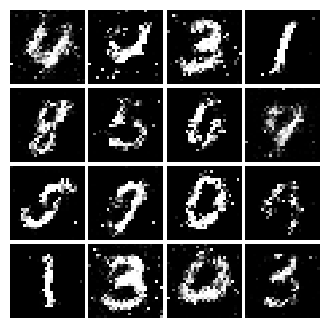

Epoch: 6, Iter: 3100, D: 1.256, G:0.9089


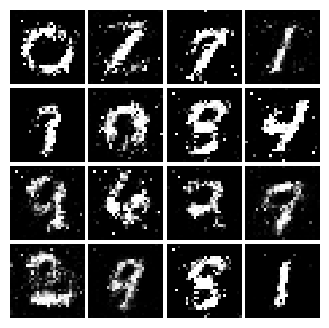

Epoch: 6, Iter: 3120, D: 1.376, G:0.8491


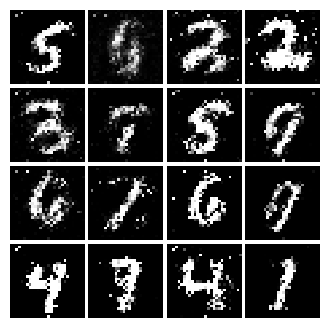

Epoch: 6, Iter: 3140, D: 1.411, G:0.8355


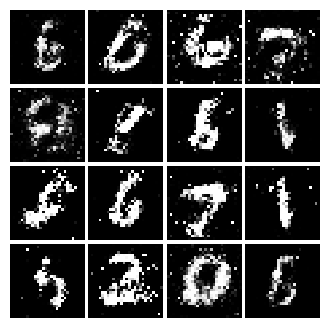

Epoch: 6, Iter: 3160, D: 1.279, G:0.9019


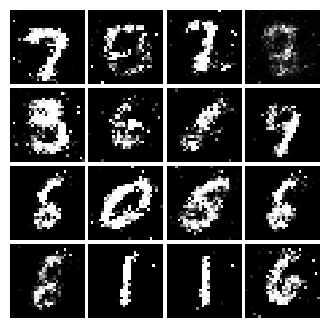

Epoch: 6, Iter: 3180, D: 1.283, G:0.8595


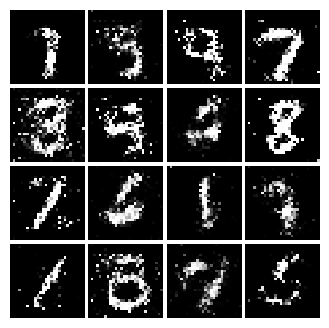

Epoch: 6, Iter: 3200, D: 1.255, G:0.861


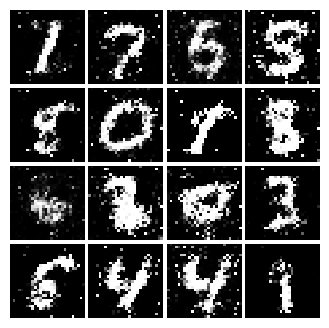

Epoch: 6, Iter: 3220, D: 1.332, G:0.8195


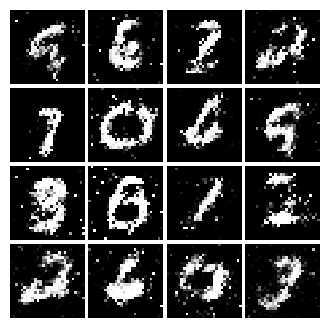

Epoch: 6, Iter: 3240, D: 1.303, G:0.808


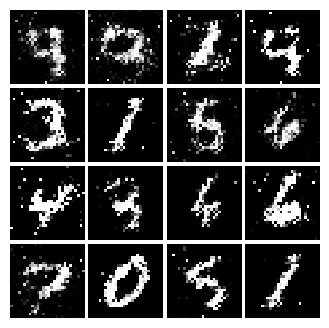

Epoch: 6, Iter: 3260, D: 1.376, G:0.7716


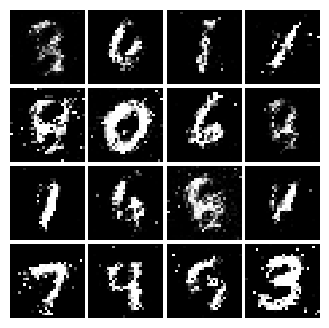

Epoch: 6, Iter: 3280, D: 1.322, G:0.88


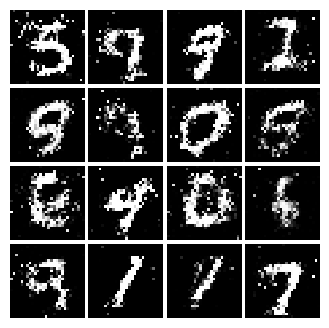

Epoch: 7, Iter: 3300, D: 1.254, G:0.8812


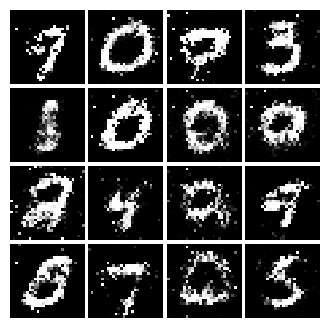

Epoch: 7, Iter: 3320, D: 1.248, G:0.9768


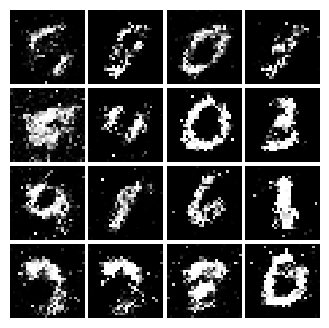

Epoch: 7, Iter: 3340, D: 1.241, G:0.8908


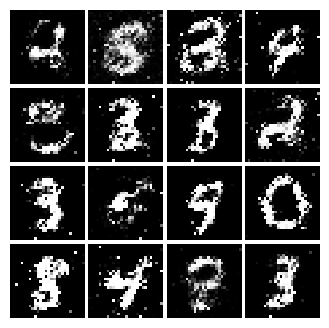

Epoch: 7, Iter: 3360, D: 1.278, G:0.6596


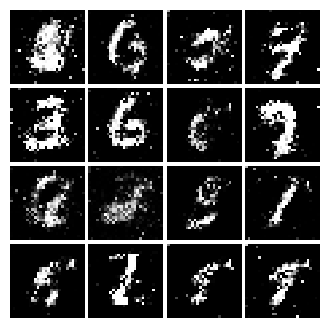

Epoch: 7, Iter: 3380, D: 1.321, G:0.7852


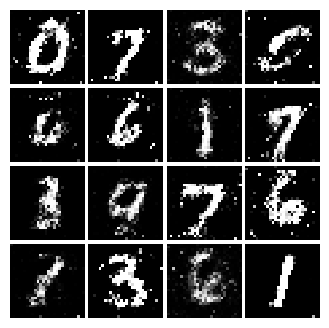

Epoch: 7, Iter: 3400, D: 1.384, G:0.854


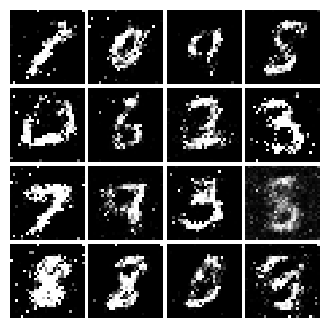

Epoch: 7, Iter: 3420, D: 1.312, G:0.9466


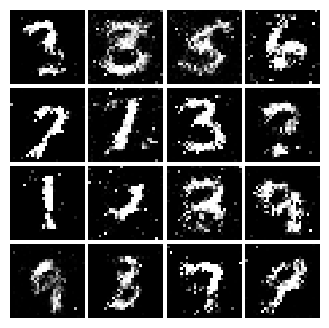

Epoch: 7, Iter: 3440, D: 1.362, G:0.9134


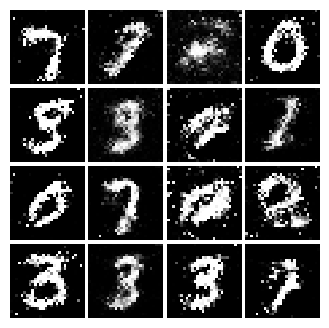

Epoch: 7, Iter: 3460, D: 1.249, G:0.8247


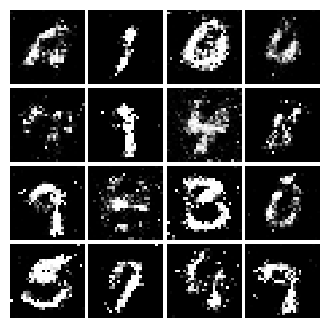

Epoch: 7, Iter: 3480, D: 1.368, G:0.7256


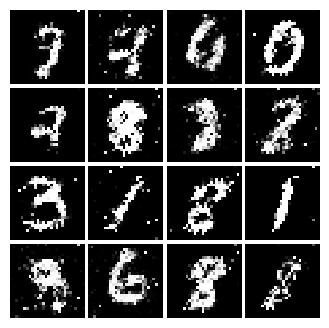

Epoch: 7, Iter: 3500, D: 1.338, G:0.8906


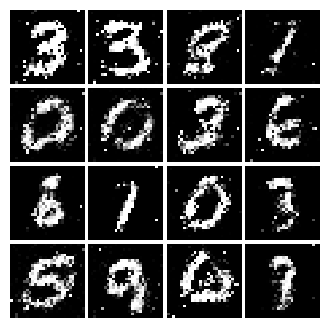

Epoch: 7, Iter: 3520, D: 1.31, G:0.8492


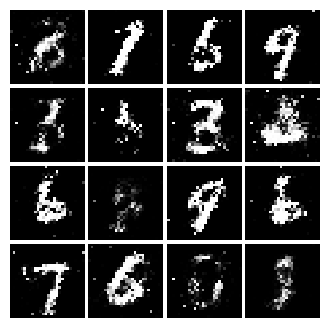

Epoch: 7, Iter: 3540, D: 1.276, G:0.8377


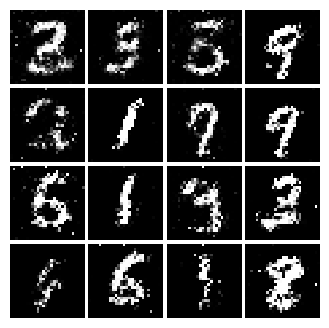

Epoch: 7, Iter: 3560, D: 1.302, G:0.914


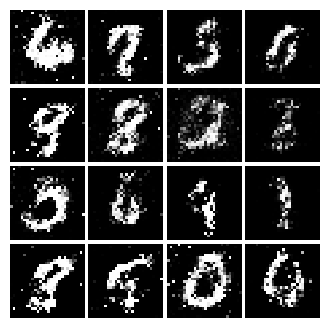

Epoch: 7, Iter: 3580, D: 1.291, G:0.7971


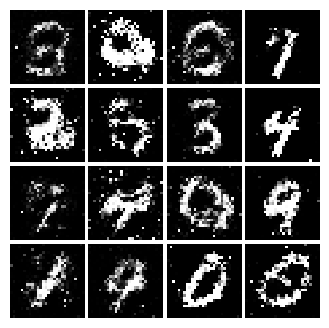

Epoch: 7, Iter: 3600, D: 1.322, G:0.8264


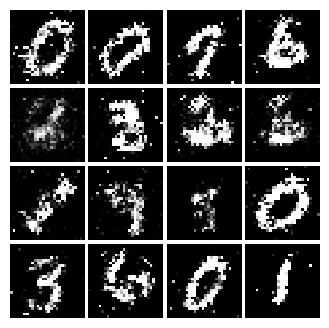

Epoch: 7, Iter: 3620, D: 1.255, G:0.885


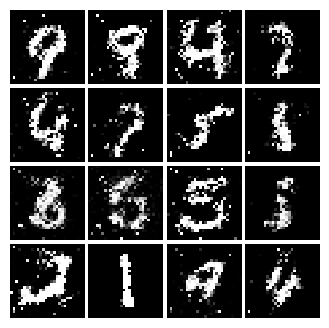

Epoch: 7, Iter: 3640, D: 1.417, G:0.8955


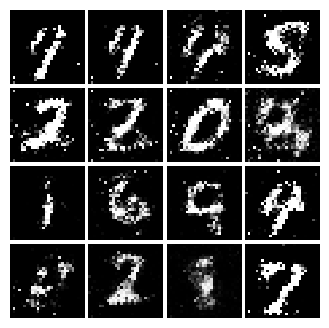

Epoch: 7, Iter: 3660, D: 1.269, G:0.9971


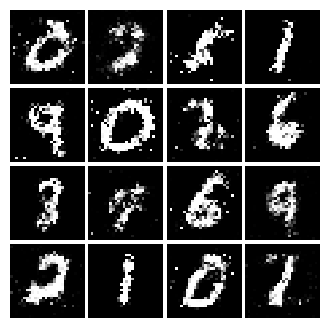

Epoch: 7, Iter: 3680, D: 1.318, G:0.857


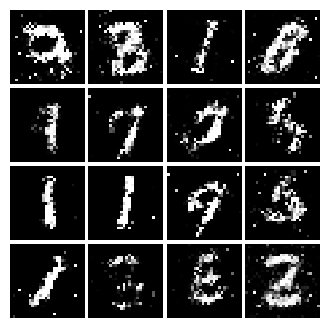

Epoch: 7, Iter: 3700, D: 1.279, G:0.8071


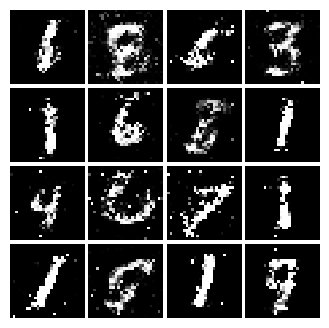

Epoch: 7, Iter: 3720, D: 1.273, G:0.788


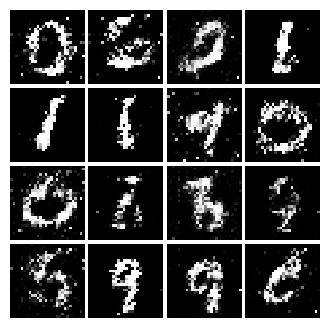

Epoch: 7, Iter: 3740, D: 1.343, G:0.7751


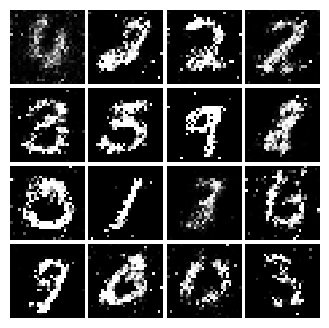

Epoch: 8, Iter: 3760, D: 1.34, G:0.8883


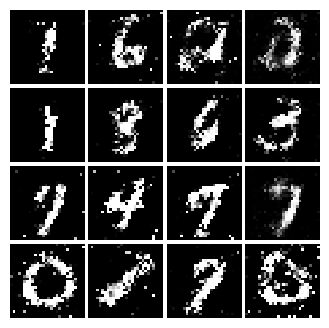

Epoch: 8, Iter: 3780, D: 1.353, G:0.8367


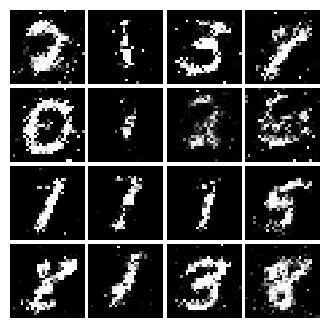

Epoch: 8, Iter: 3800, D: 1.282, G:0.9172


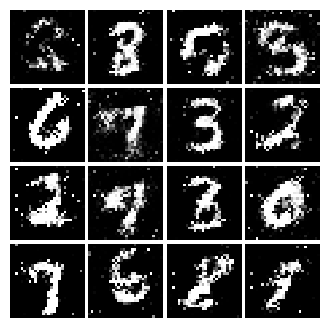

Epoch: 8, Iter: 3820, D: 1.331, G:0.8165


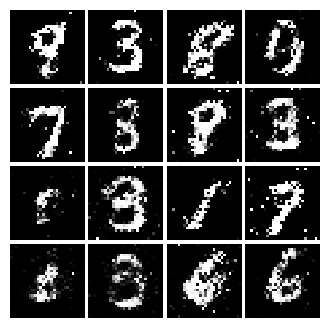

Epoch: 8, Iter: 3840, D: 1.34, G:0.825


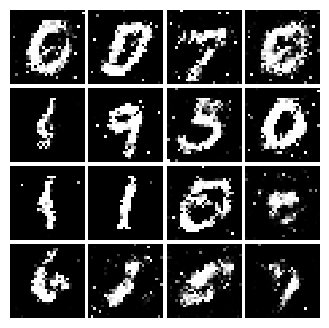

Epoch: 8, Iter: 3860, D: 1.298, G:0.8682


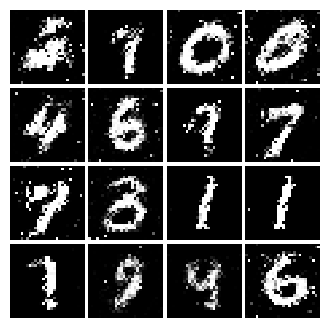

Epoch: 8, Iter: 3880, D: 1.366, G:0.7863


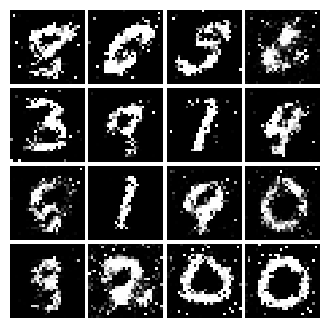

Epoch: 8, Iter: 3900, D: 1.281, G:0.8928


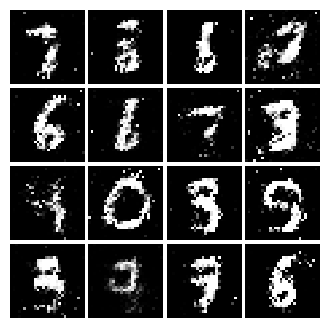

Epoch: 8, Iter: 3920, D: 1.269, G:0.8784


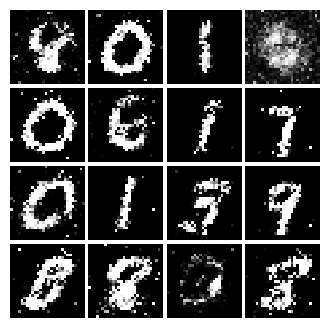

Epoch: 8, Iter: 3940, D: 1.391, G:0.821


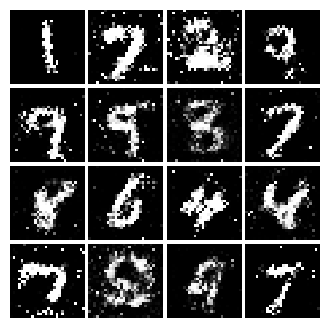

Epoch: 8, Iter: 3960, D: 1.367, G:0.7573


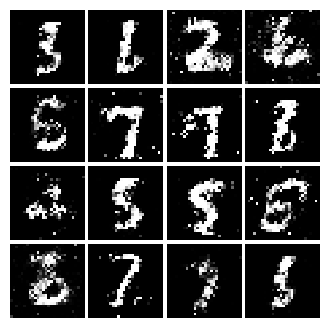

Epoch: 8, Iter: 3980, D: 1.367, G:0.8137


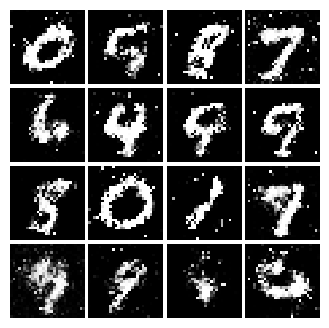

Epoch: 8, Iter: 4000, D: 1.325, G:0.7335


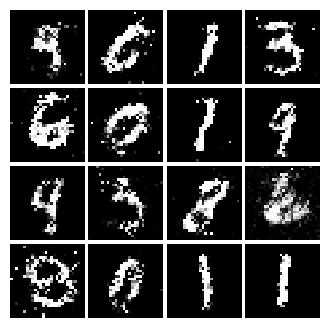

Epoch: 8, Iter: 4020, D: 1.349, G:0.8145


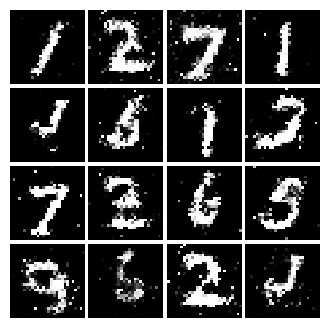

Epoch: 8, Iter: 4040, D: 1.346, G:0.8184


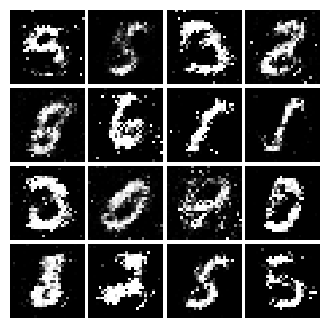

Epoch: 8, Iter: 4060, D: 1.305, G:0.8378


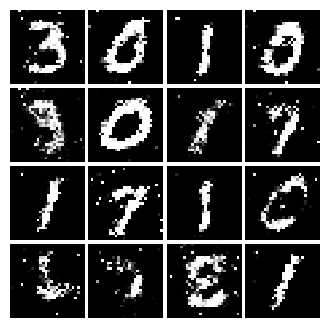

Epoch: 8, Iter: 4080, D: 1.417, G:0.8122


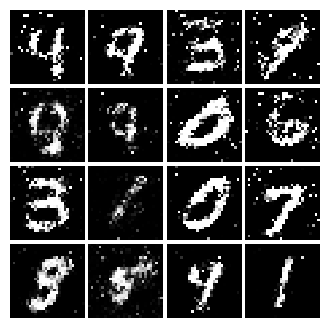

Epoch: 8, Iter: 4100, D: 1.346, G:0.8328


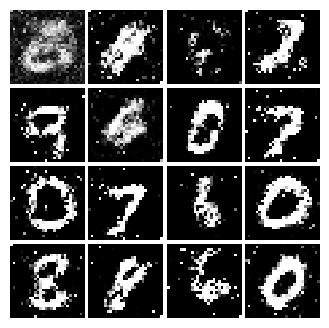

Epoch: 8, Iter: 4120, D: 1.386, G:0.7436


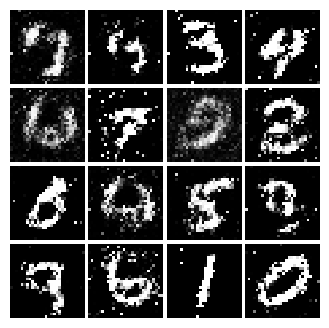

Epoch: 8, Iter: 4140, D: 1.317, G:0.9528


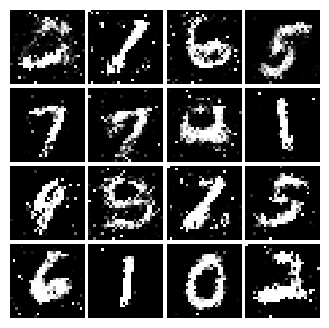

Epoch: 8, Iter: 4160, D: 1.308, G:0.8311


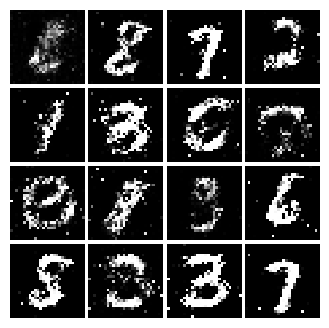

Epoch: 8, Iter: 4180, D: 1.364, G:0.7565


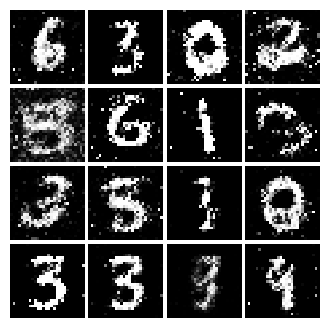

Epoch: 8, Iter: 4200, D: 1.224, G:0.742


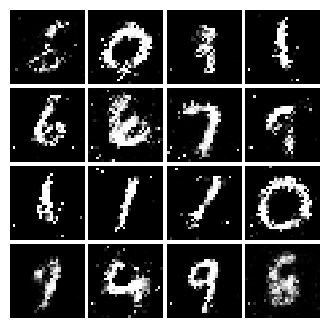

Epoch: 8, Iter: 4220, D: 1.189, G:0.9241


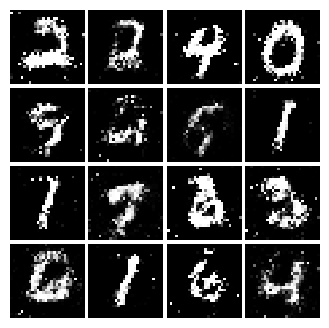

Epoch: 9, Iter: 4240, D: 1.355, G:0.7399


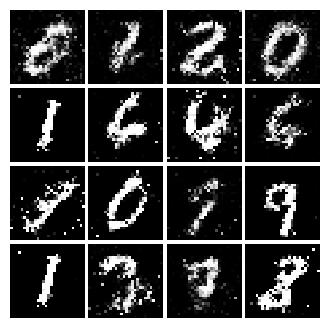

Epoch: 9, Iter: 4260, D: 1.457, G:0.8027


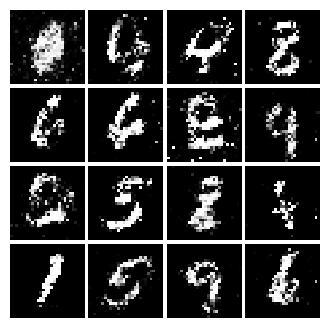

Epoch: 9, Iter: 4280, D: 1.335, G:0.7385


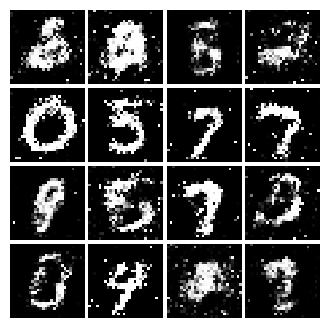

Epoch: 9, Iter: 4300, D: 1.389, G:0.9795


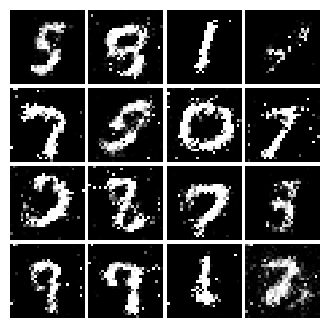

Epoch: 9, Iter: 4320, D: 1.336, G:0.7635


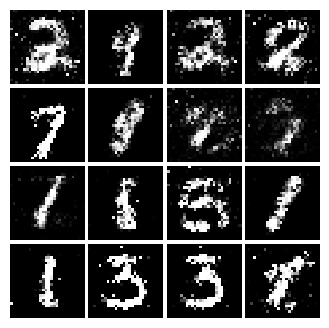

Epoch: 9, Iter: 4340, D: 1.331, G:0.8644


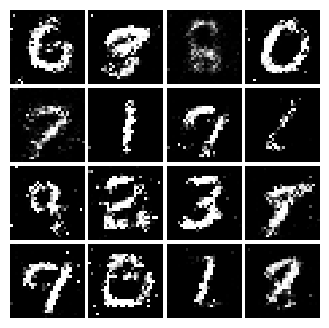

Epoch: 9, Iter: 4360, D: 1.305, G:0.8479


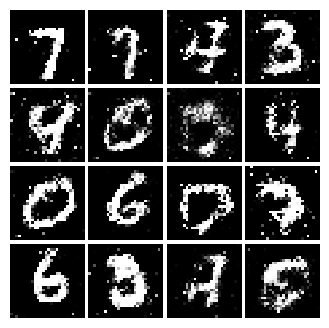

Epoch: 9, Iter: 4380, D: 1.454, G:0.7811


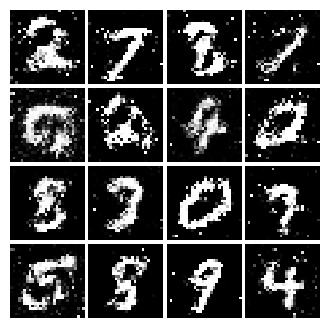

Epoch: 9, Iter: 4400, D: 1.211, G:0.9741


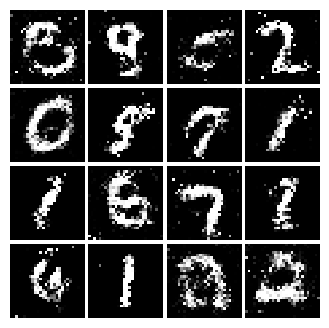

Epoch: 9, Iter: 4420, D: 1.256, G:0.7699


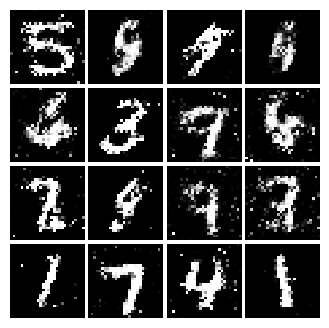

Epoch: 9, Iter: 4440, D: 1.311, G:0.7764


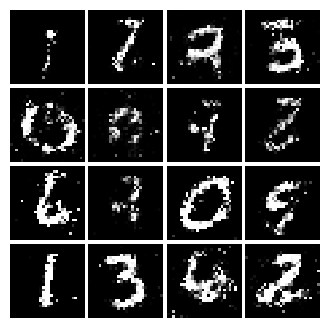

Epoch: 9, Iter: 4460, D: 1.313, G:0.8911


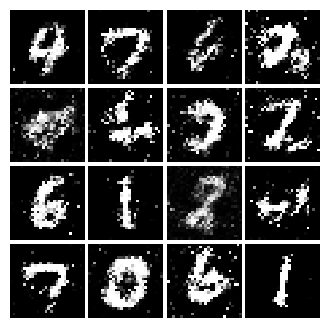

Epoch: 9, Iter: 4480, D: 1.341, G:0.7343


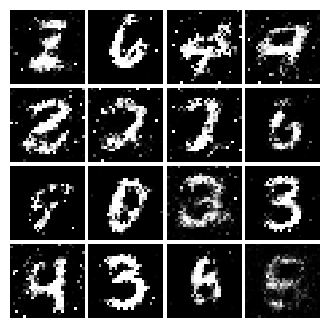

Epoch: 9, Iter: 4500, D: 1.381, G:0.8009


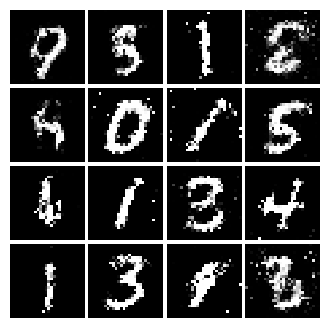

Epoch: 9, Iter: 4520, D: 1.388, G:0.8407


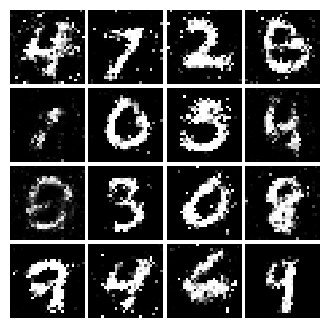

Epoch: 9, Iter: 4540, D: 1.391, G:0.7073


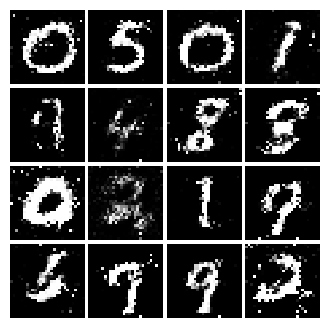

Epoch: 9, Iter: 4560, D: 1.258, G:0.7712


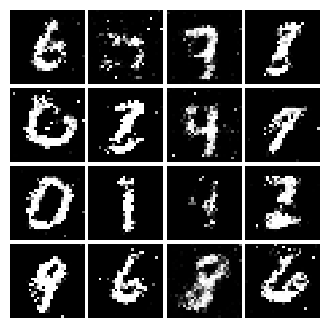

Epoch: 9, Iter: 4580, D: 1.321, G:0.7873


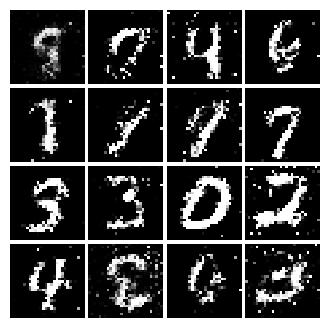

Epoch: 9, Iter: 4600, D: 1.312, G:0.7697


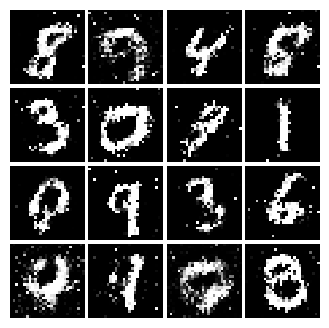

Epoch: 9, Iter: 4620, D: 1.368, G:0.8784


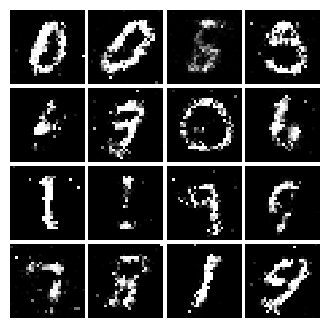

Epoch: 9, Iter: 4640, D: 1.326, G:0.8219


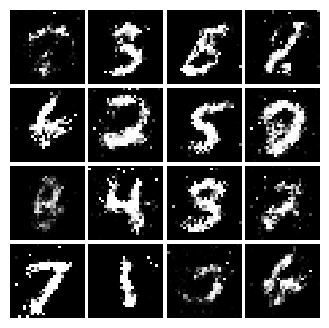

Epoch: 9, Iter: 4660, D: 1.338, G:0.8244


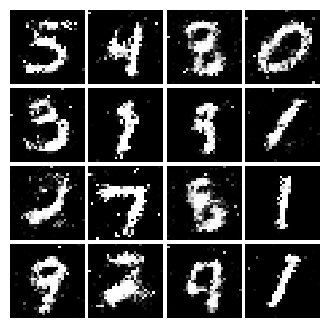

Epoch: 9, Iter: 4680, D: 1.341, G:0.8057


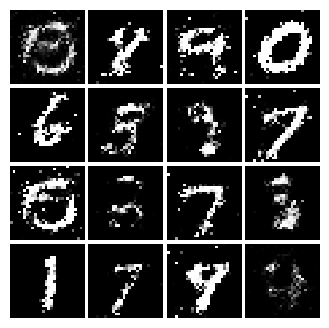

Final images


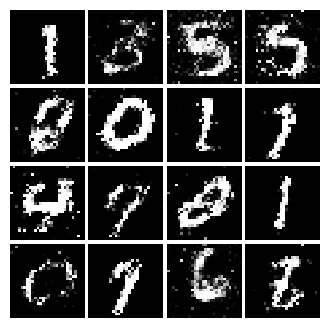

In [18]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_optimizer, G_optimizer = get_optimizers()

# Run it!
run_a_gan(D, G, D_optimizer, G_optimizer, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [21]:
def ls_discriminator_loss(score_real, score_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.

    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    ###############################################################
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ###############################################################
    loss_real = 0.5 * tf.reduce_mean((score_real - 1) ** 2)
    loss_fake = 0.5 * tf.reduce_mean(score_fake ** 2)
    loss = loss_real + loss_fake
    
    #############################################################
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    #############################################################
    return loss

def ls_generator_loss(score_fake):
    """
    Computes the Least-Squares GAN loss for the generator.

    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    ###############################################################
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ###############################################################

    loss = 0.5 * tf.reduce_mean((score_fake - 1) ** 2)
    #############################################################
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    #############################################################
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [22]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):

    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.1607, G:0.5648


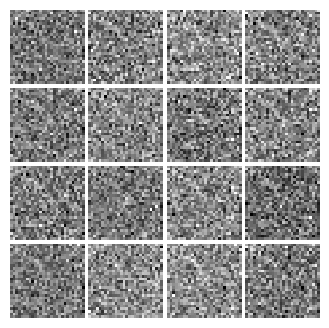

Epoch: 0, Iter: 20, D: 0.05764, G:1.531


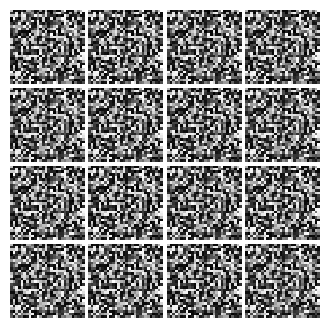

Epoch: 0, Iter: 40, D: 0.0165, G:0.6837


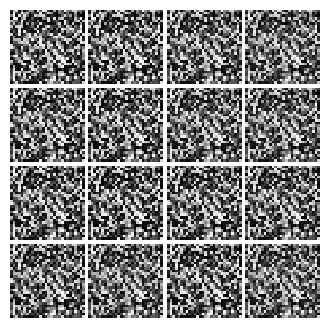

Epoch: 0, Iter: 60, D: 0.04264, G:0.8513


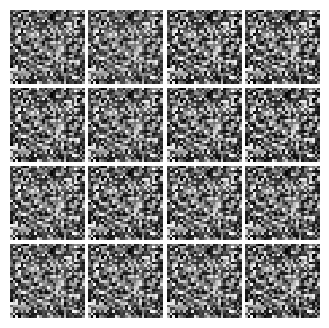

Epoch: 0, Iter: 80, D: 0.05821, G:0.4288


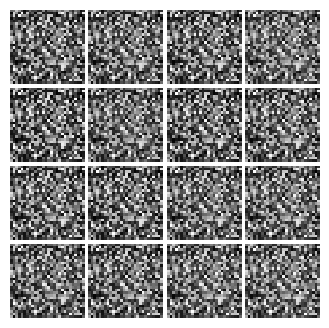

Epoch: 0, Iter: 100, D: 0.2586, G:0.4435


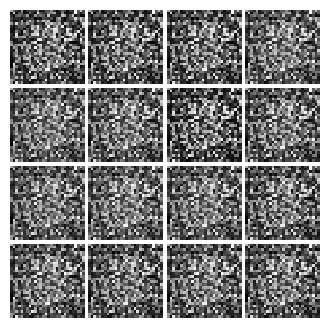

Epoch: 0, Iter: 120, D: 0.0307, G:0.7072


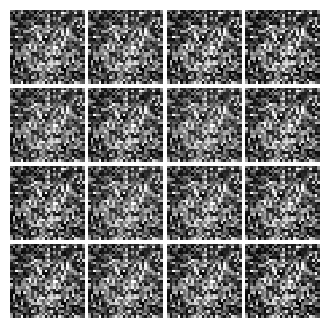

Epoch: 0, Iter: 140, D: 0.02799, G:0.4567


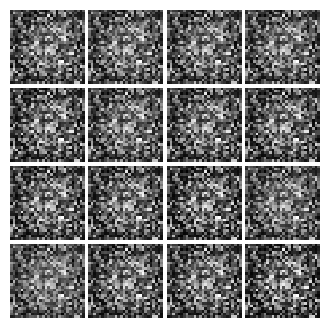

Epoch: 0, Iter: 160, D: 0.08382, G:0.438


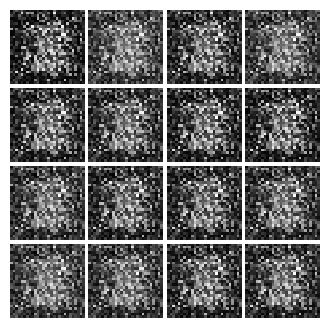

Epoch: 0, Iter: 180, D: 0.2132, G:0.2662


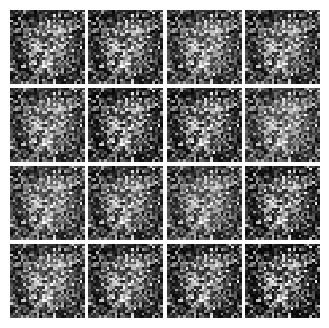

Epoch: 0, Iter: 200, D: 0.5046, G:0.4921


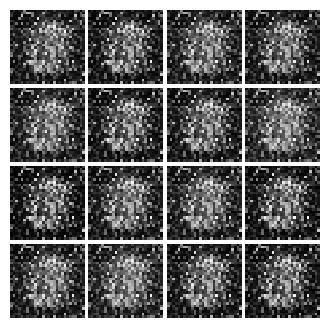

Epoch: 0, Iter: 220, D: 1.905, G:0.03935


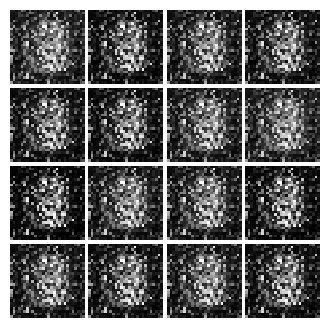

Epoch: 0, Iter: 240, D: 0.07849, G:0.5863


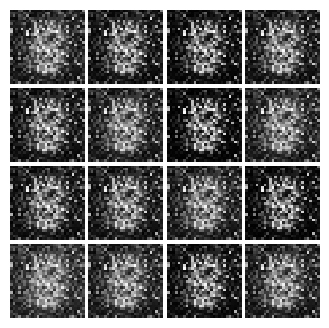

Epoch: 0, Iter: 260, D: 0.2114, G:0.1734


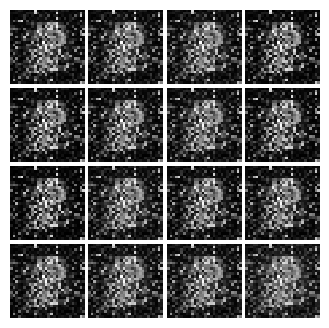

Epoch: 0, Iter: 280, D: 0.1844, G:0.3851


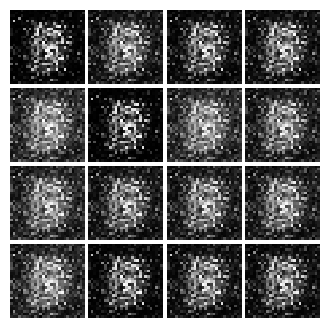

Epoch: 0, Iter: 300, D: 0.08721, G:0.3717


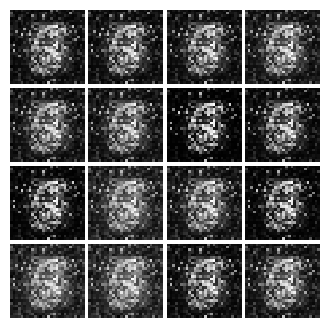

Epoch: 0, Iter: 320, D: 0.3659, G:0.5369


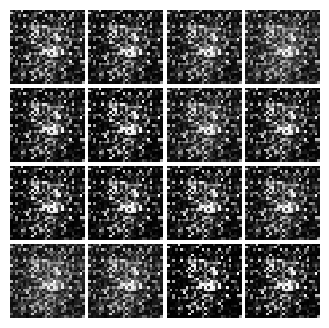

Epoch: 0, Iter: 340, D: 0.2087, G:0.03488


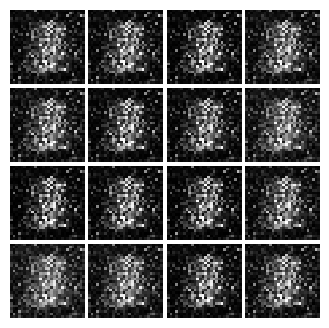

Epoch: 0, Iter: 360, D: 0.1397, G:0.3368


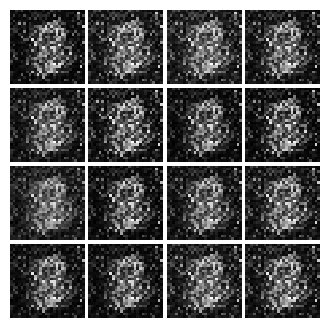

Epoch: 0, Iter: 380, D: 0.1025, G:0.5456


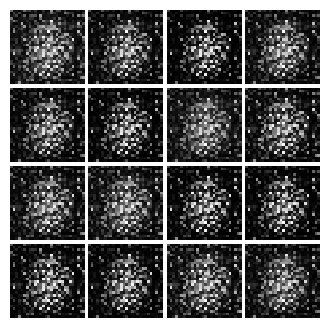

Epoch: 0, Iter: 400, D: 0.1141, G:0.4591


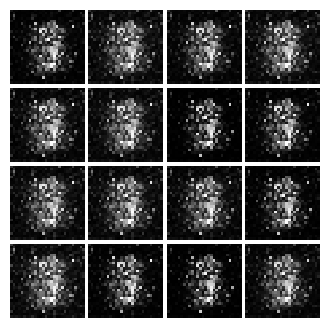

Epoch: 0, Iter: 420, D: 0.07961, G:0.4184


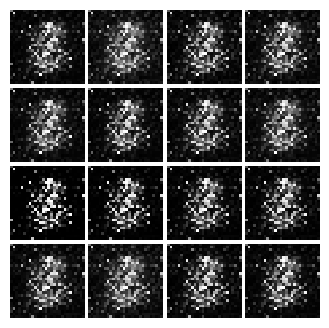

Epoch: 0, Iter: 440, D: 0.2245, G:0.9922


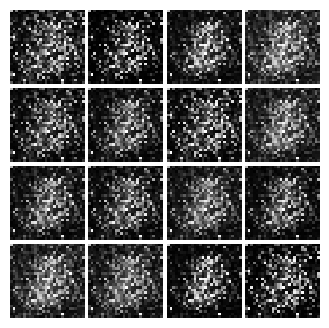

Epoch: 0, Iter: 460, D: 0.1229, G:0.6924


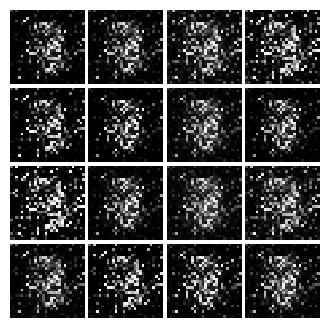

Epoch: 1, Iter: 480, D: 0.1462, G:0.4562


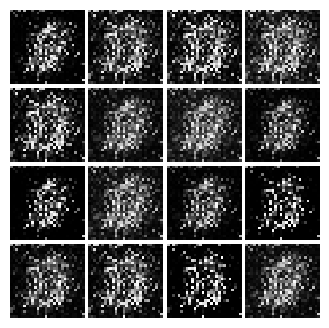

Epoch: 1, Iter: 500, D: 0.1366, G:0.6666


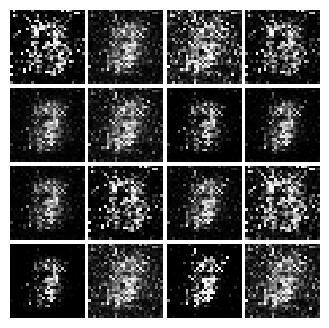

Epoch: 1, Iter: 520, D: 0.1222, G:0.3991


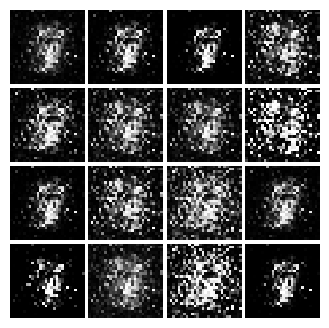

Epoch: 1, Iter: 540, D: 0.1335, G:0.2798


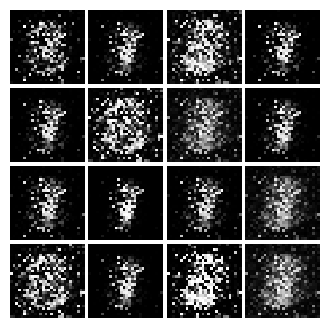

Epoch: 1, Iter: 560, D: 0.06395, G:0.4324


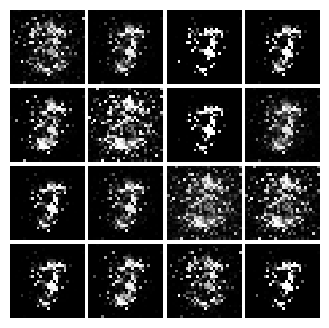

Epoch: 1, Iter: 580, D: 0.07796, G:0.4122


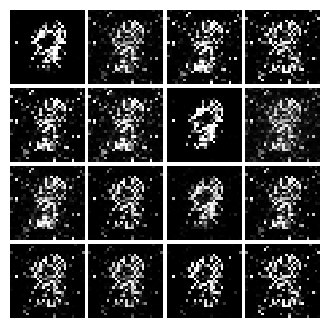

Epoch: 1, Iter: 600, D: 0.1076, G:0.3711


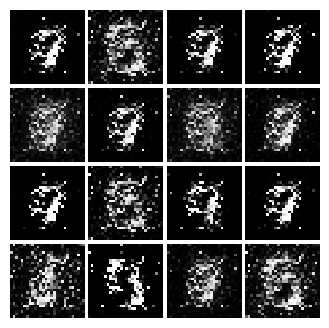

Epoch: 1, Iter: 620, D: 0.5273, G:0.05193


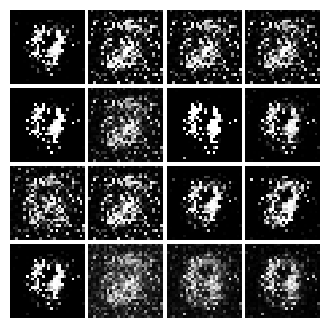

Epoch: 1, Iter: 640, D: 0.1108, G:0.5086


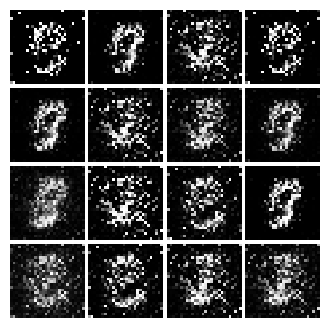

Epoch: 1, Iter: 660, D: 0.2907, G:0.7814


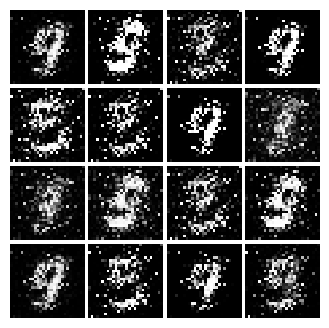

Epoch: 1, Iter: 680, D: 0.1417, G:0.4988


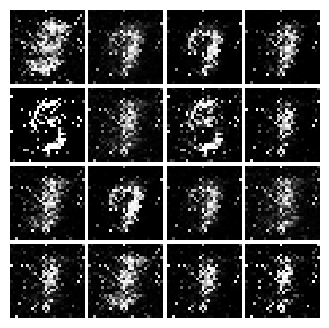

Epoch: 1, Iter: 700, D: 0.1359, G:0.4324


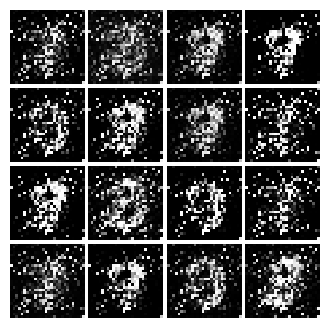

Epoch: 1, Iter: 720, D: 0.1523, G:0.3775


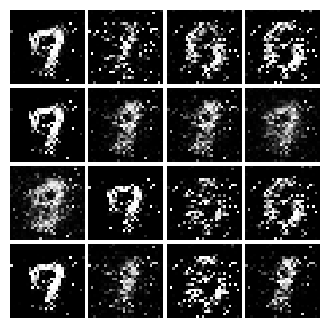

Epoch: 1, Iter: 740, D: 0.1241, G:0.401


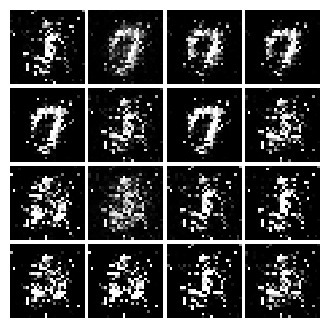

Epoch: 1, Iter: 760, D: 0.1062, G:0.5006


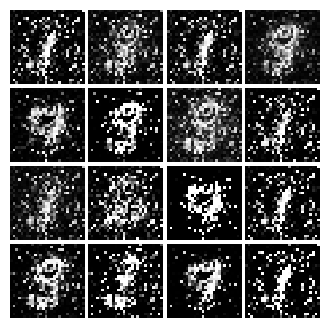

Epoch: 1, Iter: 780, D: 0.1696, G:0.4668


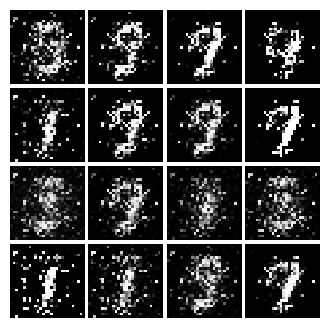

Epoch: 1, Iter: 800, D: 0.1518, G:0.27


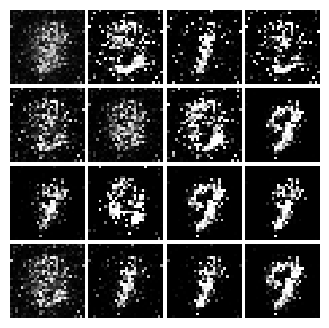

Epoch: 1, Iter: 820, D: 0.139, G:0.3275


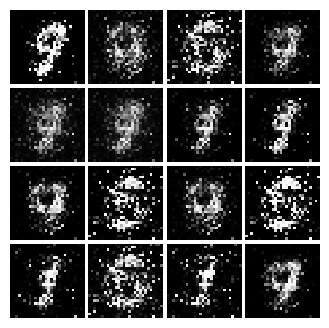

Epoch: 1, Iter: 840, D: 0.2001, G:0.1995


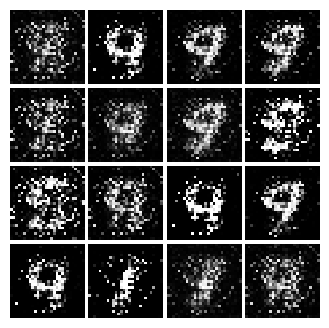

Epoch: 1, Iter: 860, D: 0.1777, G:0.7399


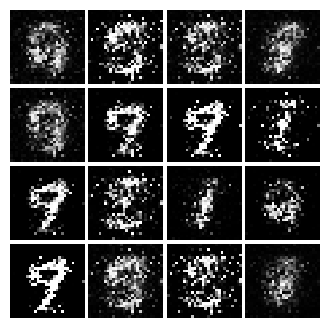

Epoch: 1, Iter: 880, D: 0.1306, G:0.3316


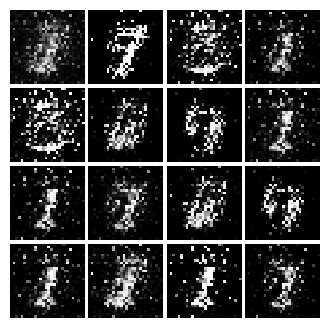

Epoch: 1, Iter: 900, D: 0.1236, G:0.364


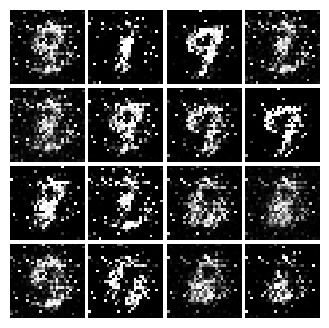

Epoch: 1, Iter: 920, D: 0.1538, G:0.3056


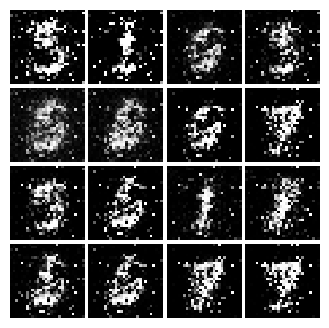

Epoch: 2, Iter: 940, D: 0.1235, G:0.3996


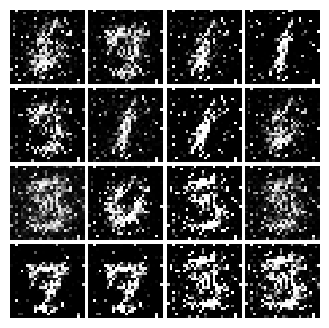

Epoch: 2, Iter: 960, D: 0.1288, G:0.287


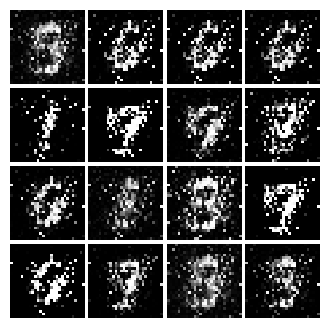

Epoch: 2, Iter: 980, D: 0.1326, G:0.4473


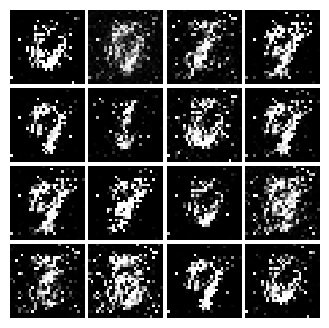

Epoch: 2, Iter: 1000, D: 0.1121, G:0.3335


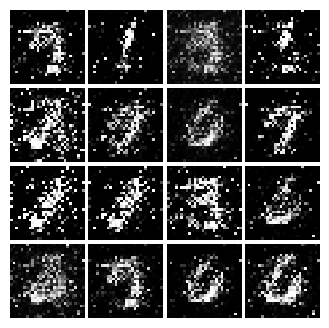

Epoch: 2, Iter: 1020, D: 0.1239, G:0.4764


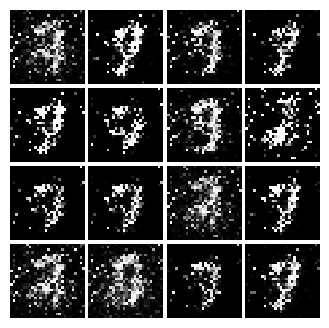

Epoch: 2, Iter: 1040, D: 0.09285, G:0.4372


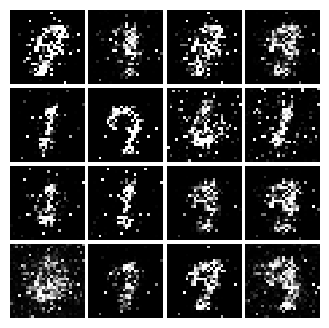

Epoch: 2, Iter: 1060, D: 0.145, G:0.3818


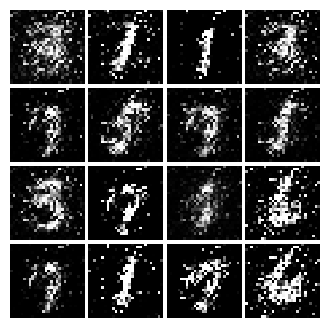

Epoch: 2, Iter: 1080, D: 0.13, G:0.3005


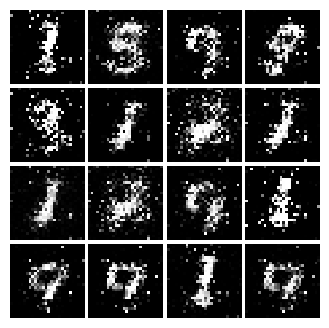

Epoch: 2, Iter: 1100, D: 0.1829, G:0.3723


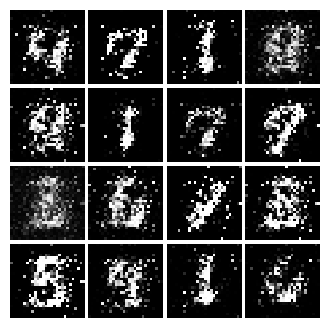

Epoch: 2, Iter: 1120, D: 0.1544, G:0.2979


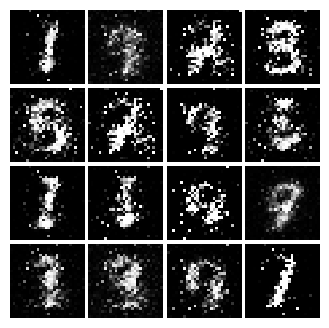

Epoch: 2, Iter: 1140, D: 0.1803, G:0.2749


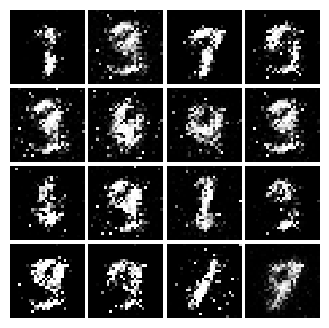

Epoch: 2, Iter: 1160, D: 0.1448, G:0.3546


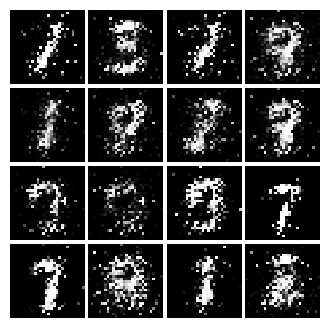

Epoch: 2, Iter: 1180, D: 0.1397, G:0.3397


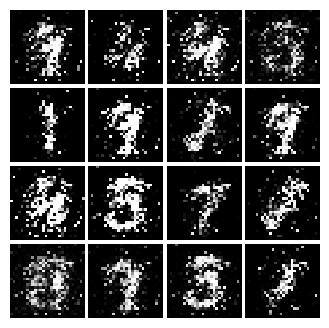

Epoch: 2, Iter: 1200, D: 0.1813, G:0.292


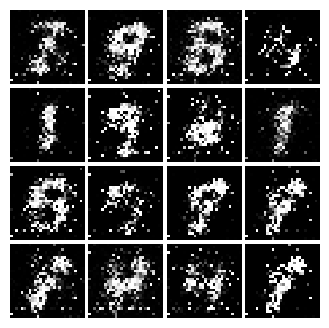

Epoch: 2, Iter: 1220, D: 0.1709, G:0.5157


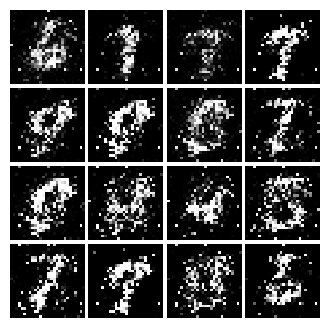

Epoch: 2, Iter: 1240, D: 0.1886, G:0.3993


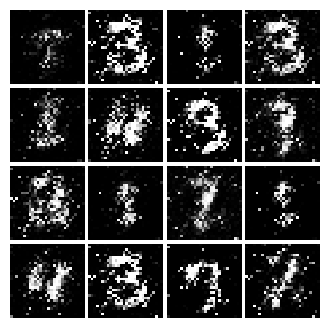

Epoch: 2, Iter: 1260, D: 0.1563, G:0.2526


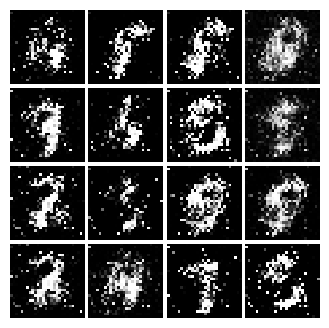

Epoch: 2, Iter: 1280, D: 0.162, G:0.2333


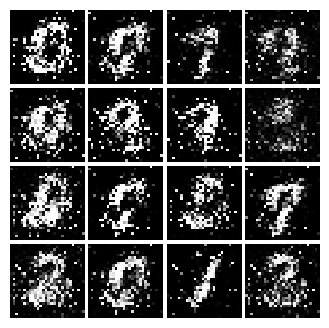

Epoch: 2, Iter: 1300, D: 0.1567, G:0.2754


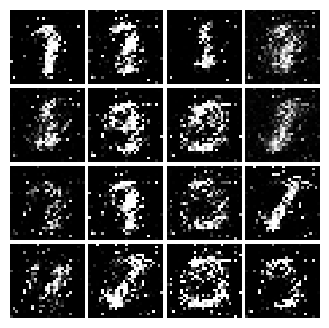

Epoch: 2, Iter: 1320, D: 0.1998, G:0.3897


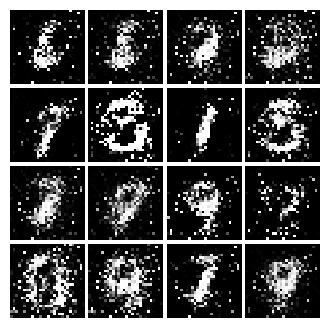

Epoch: 2, Iter: 1340, D: 0.1862, G:0.2638


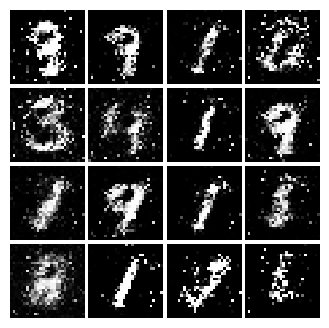

Epoch: 2, Iter: 1360, D: 0.2168, G:0.4167


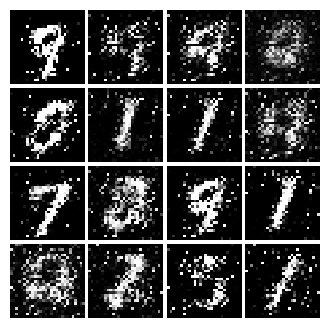

Epoch: 2, Iter: 1380, D: 0.1637, G:0.316


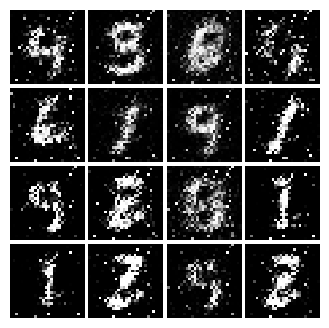

Epoch: 2, Iter: 1400, D: 0.1737, G:0.2032


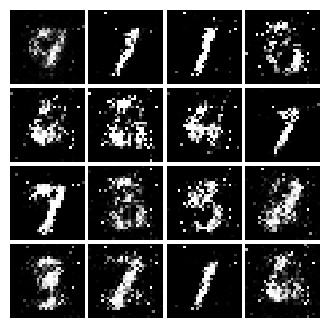

Epoch: 3, Iter: 1420, D: 0.2173, G:0.1918


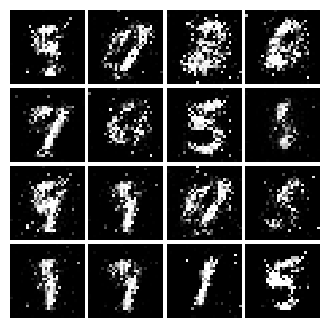

Epoch: 3, Iter: 1440, D: 0.181, G:0.2617


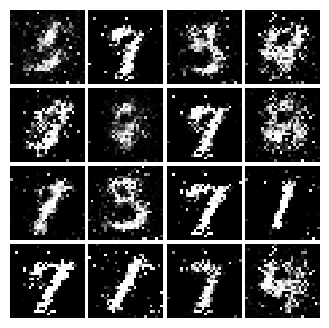

Epoch: 3, Iter: 1460, D: 0.187, G:0.2564


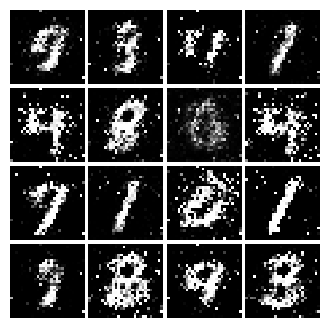

Epoch: 3, Iter: 1480, D: 0.1905, G:0.2447


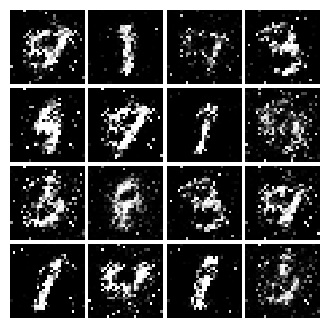

Epoch: 3, Iter: 1500, D: 0.2236, G:0.2469


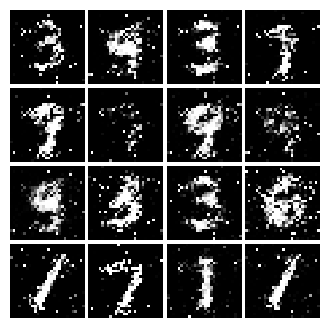

Epoch: 3, Iter: 1520, D: 0.1809, G:0.2883


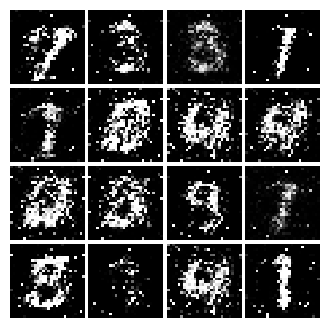

Epoch: 3, Iter: 1540, D: 0.1944, G:0.2404


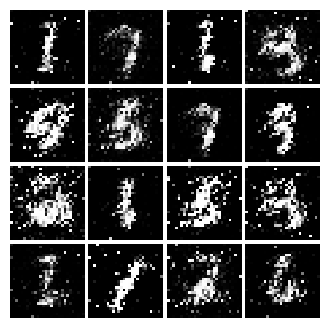

Epoch: 3, Iter: 1560, D: 0.1611, G:0.2355


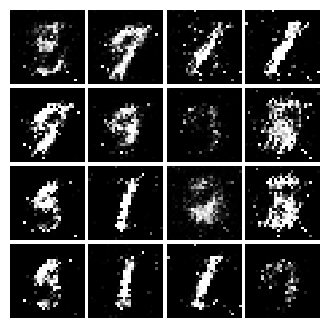

Epoch: 3, Iter: 1580, D: 0.1859, G:0.2557


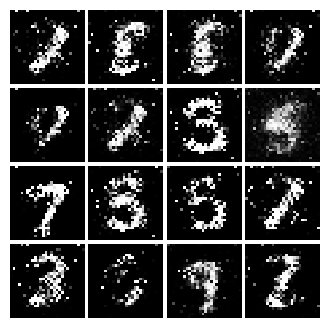

Epoch: 3, Iter: 1600, D: 0.1935, G:0.2112


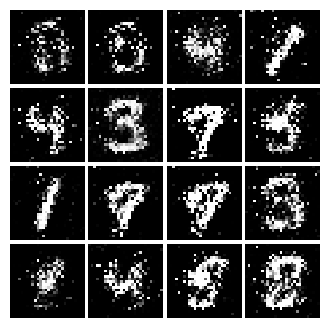

Epoch: 3, Iter: 1620, D: 0.1464, G:0.282


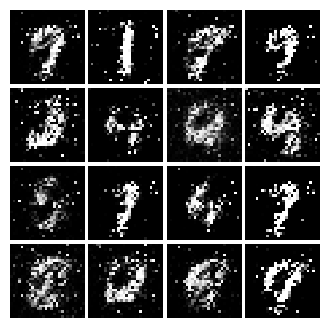

Epoch: 3, Iter: 1640, D: 0.1848, G:0.2444


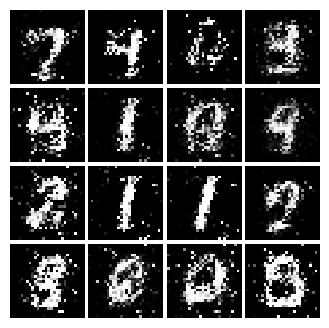

Epoch: 3, Iter: 1660, D: 0.1686, G:0.223


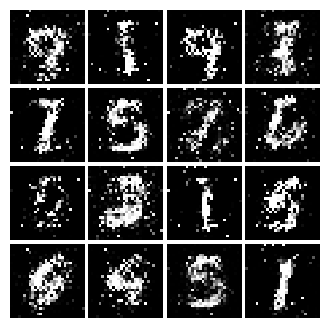

Epoch: 3, Iter: 1680, D: 0.1696, G:0.2623


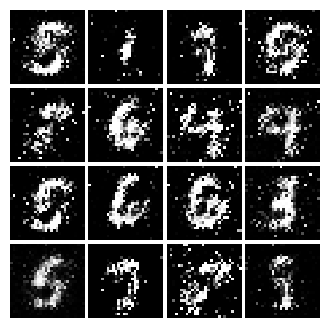

Epoch: 3, Iter: 1700, D: 0.2154, G:0.3113


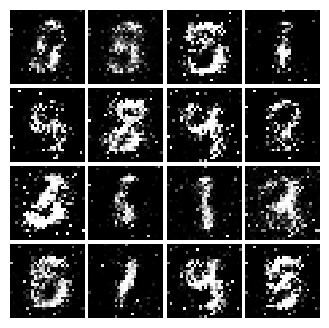

Epoch: 3, Iter: 1720, D: 0.1712, G:0.2472


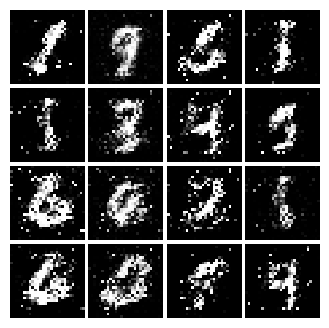

Epoch: 3, Iter: 1740, D: 0.1983, G:0.2489


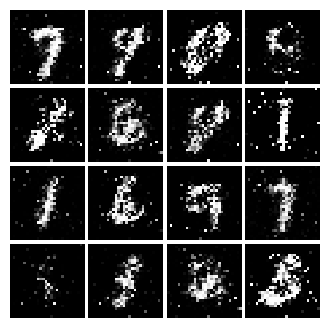

Epoch: 3, Iter: 1760, D: 0.1659, G:0.2457


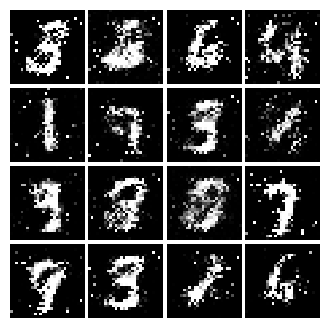

Epoch: 3, Iter: 1780, D: 0.1763, G:0.2233


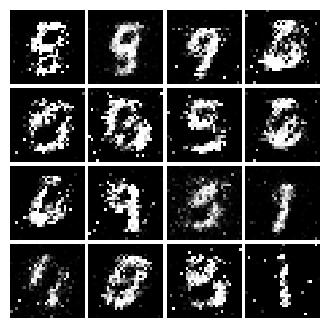

Epoch: 3, Iter: 1800, D: 0.1937, G:0.2121


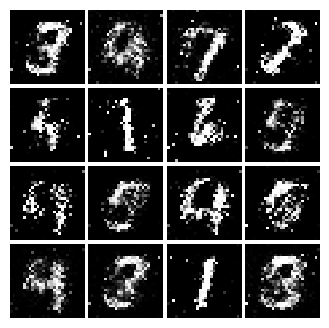

Epoch: 3, Iter: 1820, D: 0.1882, G:0.2666


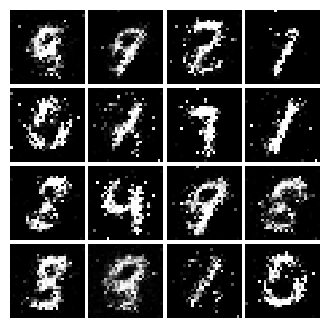

Epoch: 3, Iter: 1840, D: 0.1926, G:0.2257


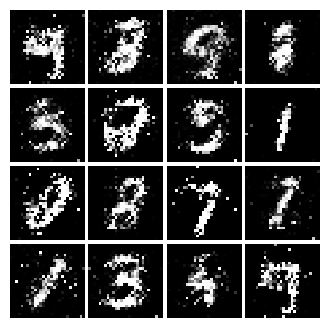

Epoch: 3, Iter: 1860, D: 0.2052, G:0.2116


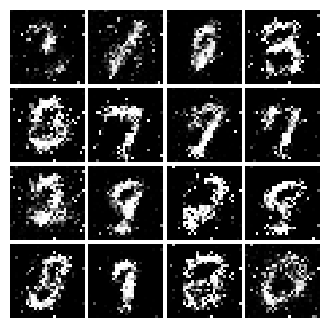

Epoch: 4, Iter: 1880, D: 0.1773, G:0.2428


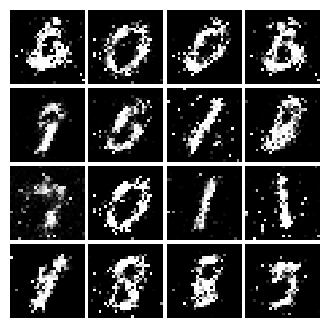

Epoch: 4, Iter: 1900, D: 0.1723, G:0.2251


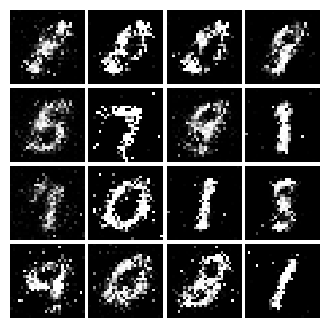

Epoch: 4, Iter: 1920, D: 0.2001, G:0.2505


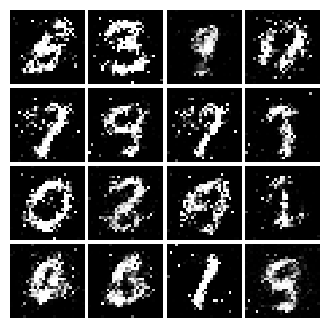

Epoch: 4, Iter: 1940, D: 0.2032, G:0.2127


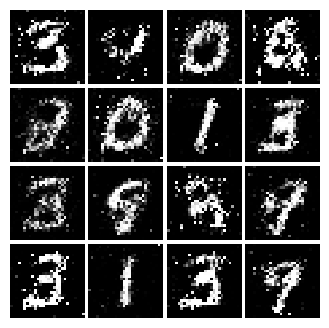

Epoch: 4, Iter: 1960, D: 0.2193, G:0.223


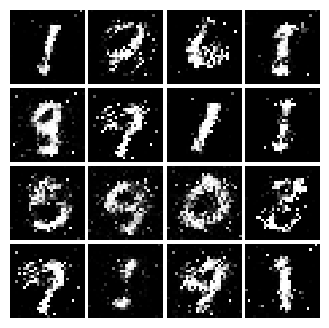

Epoch: 4, Iter: 1980, D: 0.2031, G:0.2375


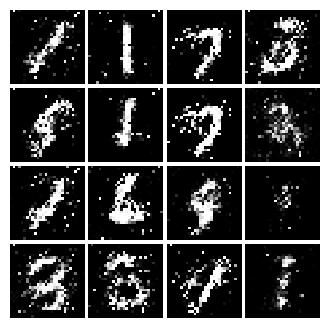

Epoch: 4, Iter: 2000, D: 0.2176, G:0.1816


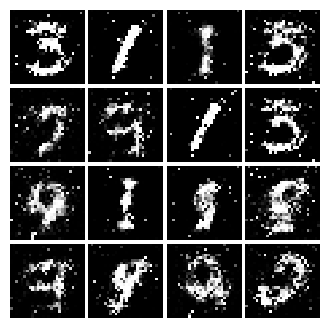

Epoch: 4, Iter: 2020, D: 0.1742, G:0.2359


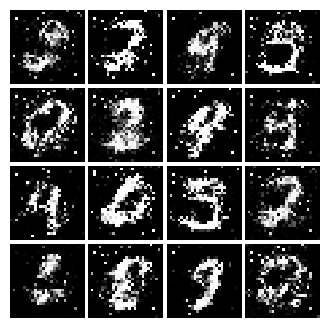

Epoch: 4, Iter: 2040, D: 0.2207, G:0.3045


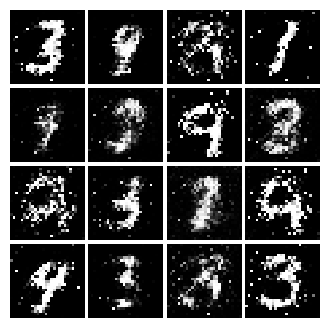

Epoch: 4, Iter: 2060, D: 0.2536, G:0.2301


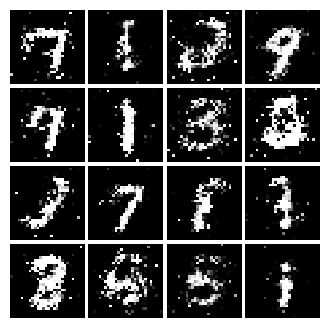

Epoch: 4, Iter: 2080, D: 0.2075, G:0.1777


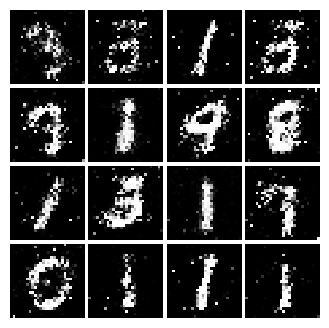

Epoch: 4, Iter: 2100, D: 0.2352, G:0.1695


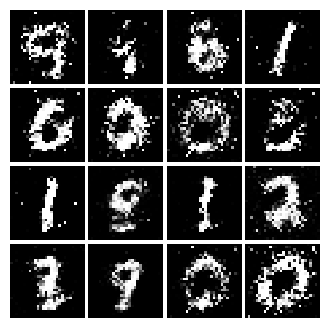

Epoch: 4, Iter: 2120, D: 0.2003, G:0.199


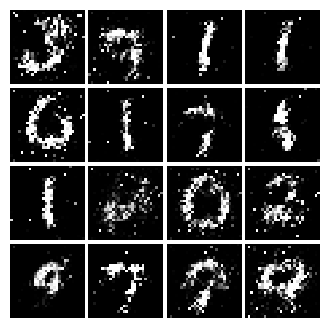

Epoch: 4, Iter: 2140, D: 0.208, G:0.2245


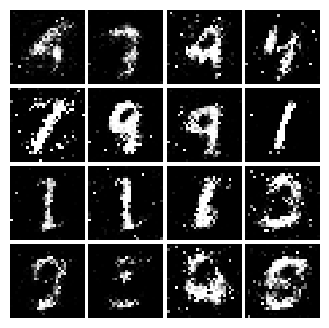

Epoch: 4, Iter: 2160, D: 0.2206, G:0.2128


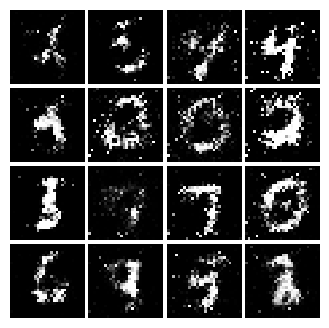

Epoch: 4, Iter: 2180, D: 0.198, G:0.2282


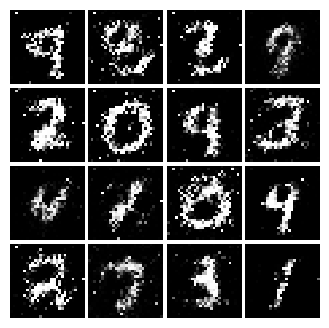

Epoch: 4, Iter: 2200, D: 0.2027, G:0.2582


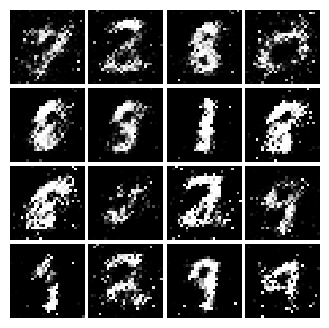

Epoch: 4, Iter: 2220, D: 0.1924, G:0.2663


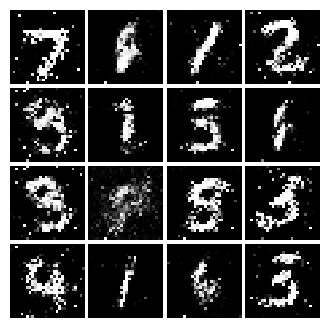

Epoch: 4, Iter: 2240, D: 0.2022, G:0.1844


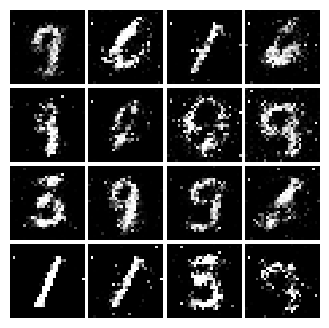

Epoch: 4, Iter: 2260, D: 0.2083, G:0.2319


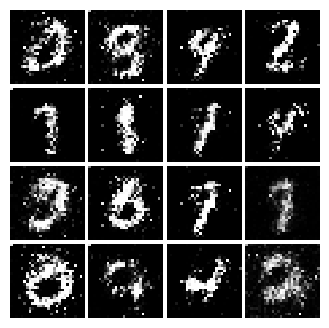

Epoch: 4, Iter: 2280, D: 0.2026, G:0.2016


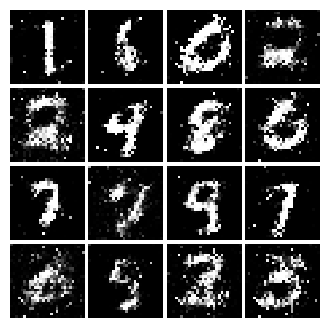

Epoch: 4, Iter: 2300, D: 0.1909, G:0.2149


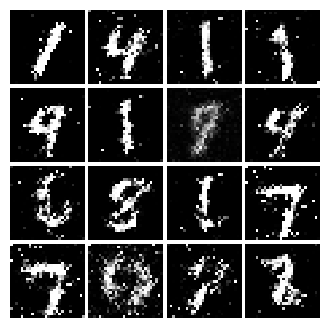

Epoch: 4, Iter: 2320, D: 0.1938, G:0.1566


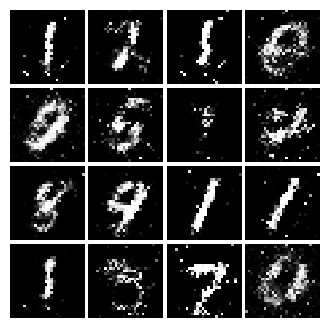

Epoch: 4, Iter: 2340, D: 0.1796, G:0.3053


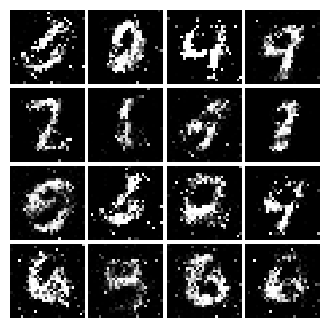

Epoch: 5, Iter: 2360, D: 0.1946, G:0.2159


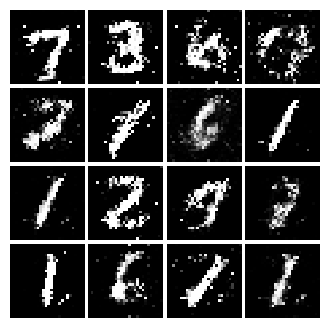

Epoch: 5, Iter: 2380, D: 0.1984, G:0.255


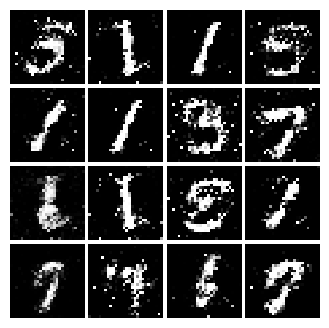

Epoch: 5, Iter: 2400, D: 0.206, G:0.209


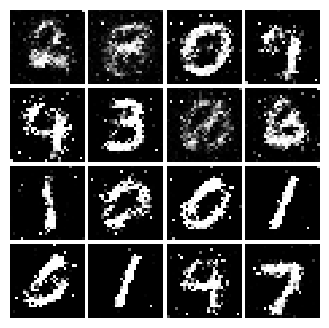

Epoch: 5, Iter: 2420, D: 0.2064, G:0.213


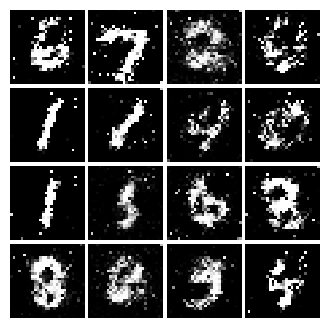

Epoch: 5, Iter: 2440, D: 0.2423, G:0.207


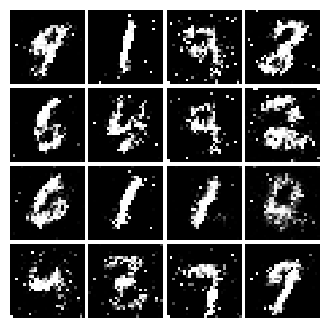

Epoch: 5, Iter: 2460, D: 0.1791, G:0.2833


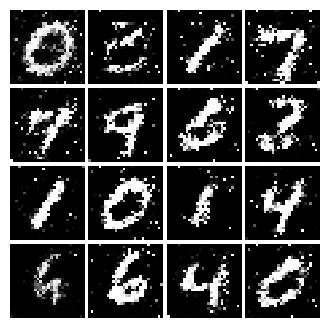

Epoch: 5, Iter: 2480, D: 0.2115, G:0.2014


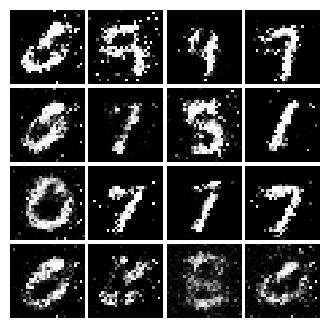

Epoch: 5, Iter: 2500, D: 0.1713, G:0.2674


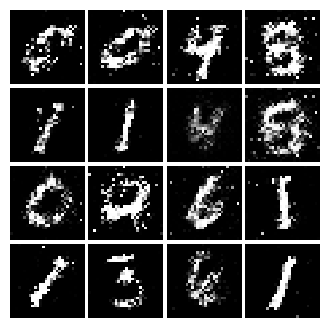

Epoch: 5, Iter: 2520, D: 0.2627, G:0.1704


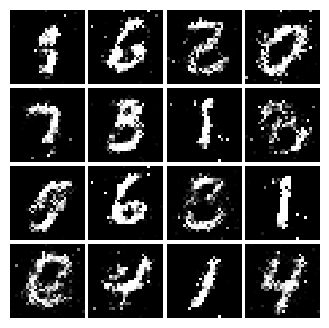

Epoch: 5, Iter: 2540, D: 0.2234, G:0.1772


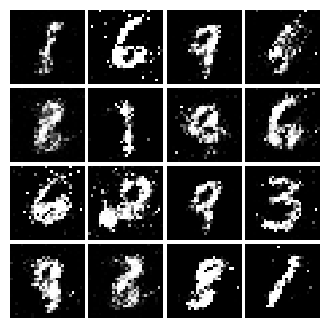

Epoch: 5, Iter: 2560, D: 0.2197, G:0.1892


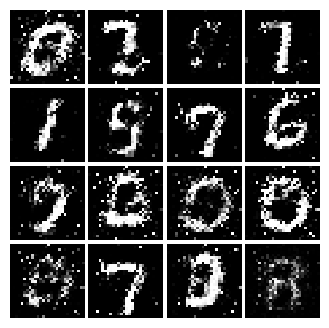

Epoch: 5, Iter: 2580, D: 0.2172, G:0.1942


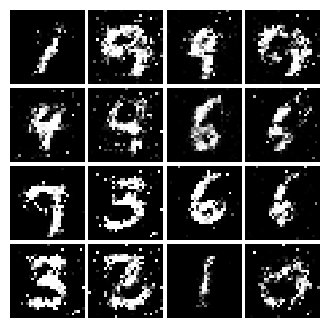

Epoch: 5, Iter: 2600, D: 0.2556, G:0.1852


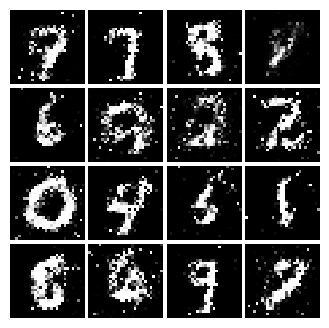

Epoch: 5, Iter: 2620, D: 0.1952, G:0.1947


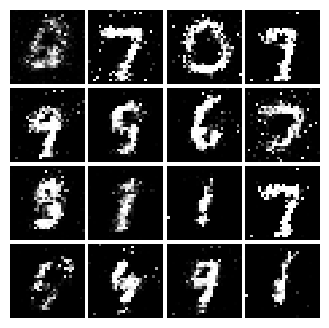

Epoch: 5, Iter: 2640, D: 0.2047, G:0.2039


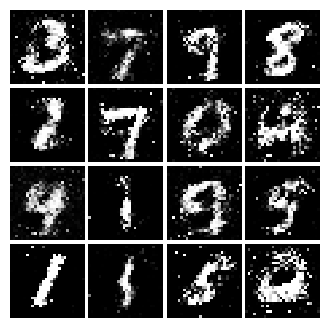

Epoch: 5, Iter: 2660, D: 0.2061, G:0.1936


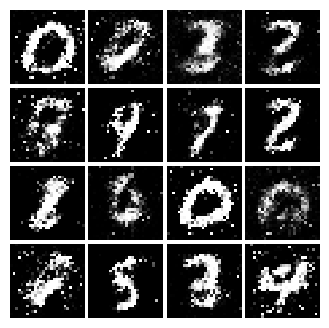

Epoch: 5, Iter: 2680, D: 0.2265, G:0.2122


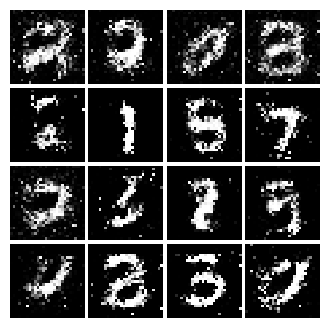

Epoch: 5, Iter: 2700, D: 0.2083, G:0.1804


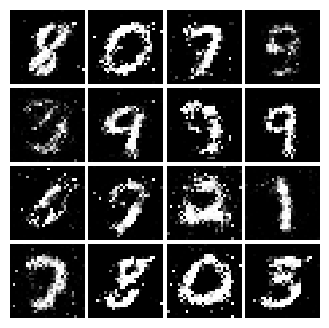

Epoch: 5, Iter: 2720, D: 0.1854, G:0.1855


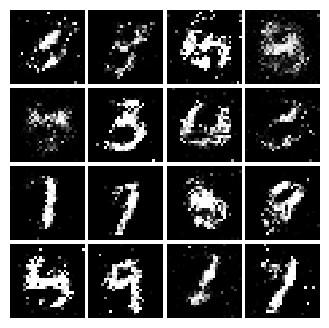

Epoch: 5, Iter: 2740, D: 0.2292, G:0.2072


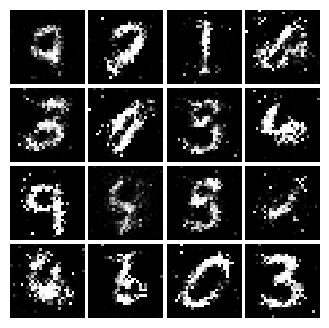

Epoch: 5, Iter: 2760, D: 0.2289, G:0.1693


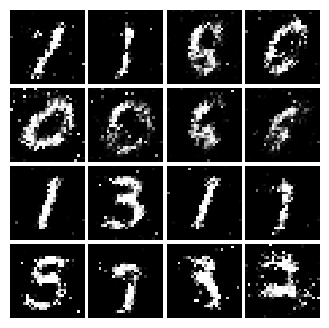

Epoch: 5, Iter: 2780, D: 0.2101, G:0.2024


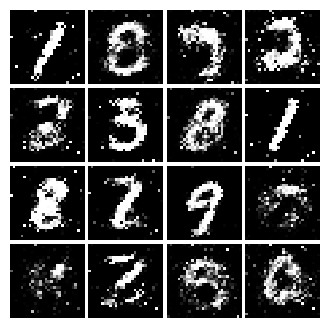

Epoch: 5, Iter: 2800, D: 0.1989, G:0.2192


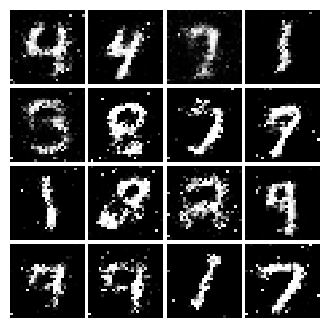

Epoch: 6, Iter: 2820, D: 0.2047, G:0.1751


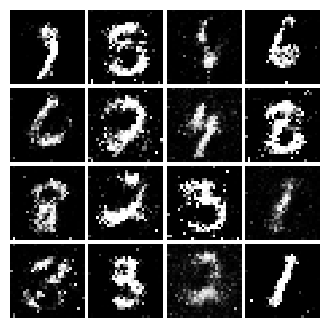

Epoch: 6, Iter: 2840, D: 0.2166, G:0.2047


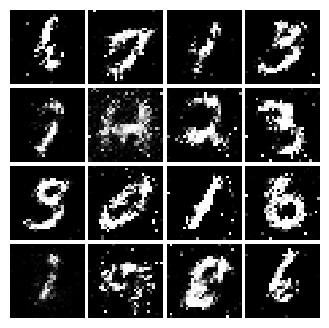

Epoch: 6, Iter: 2860, D: 0.2174, G:0.2125


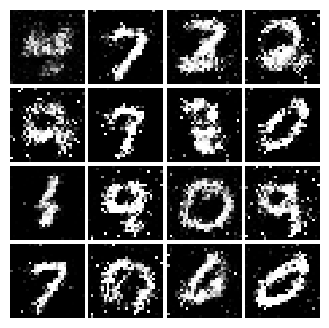

Epoch: 6, Iter: 2880, D: 0.1881, G:0.2423


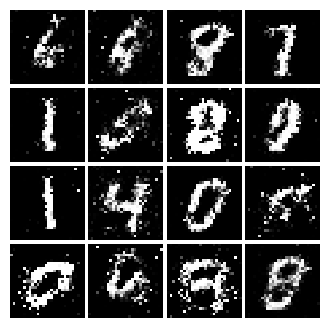

Epoch: 6, Iter: 2900, D: 0.2272, G:0.1855


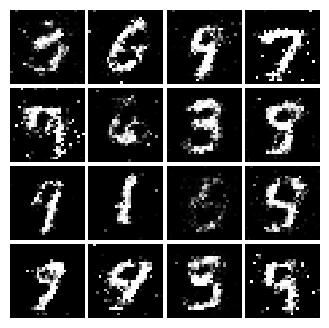

Epoch: 6, Iter: 2920, D: 0.2434, G:0.1828


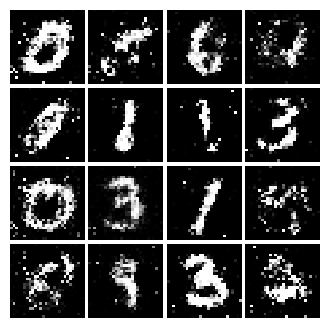

Epoch: 6, Iter: 2940, D: 0.2283, G:0.1902


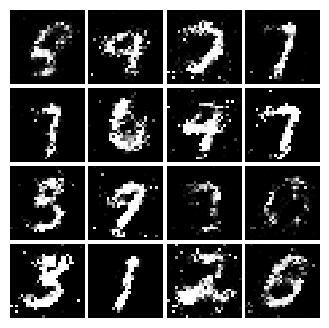

Epoch: 6, Iter: 2960, D: 0.2078, G:0.1741


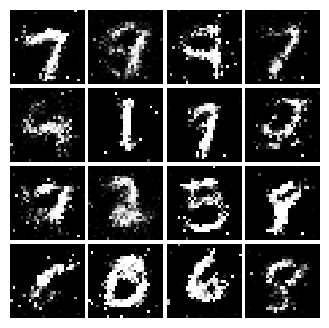

Epoch: 6, Iter: 2980, D: 0.237, G:0.1579


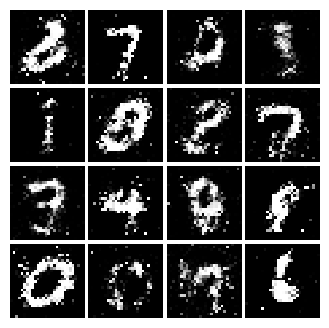

Epoch: 6, Iter: 3000, D: 0.2329, G:0.1809


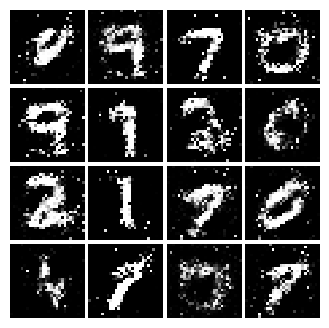

Epoch: 6, Iter: 3020, D: 0.2205, G:0.1926


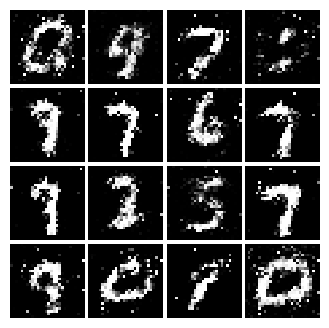

Epoch: 6, Iter: 3040, D: 0.2326, G:0.236


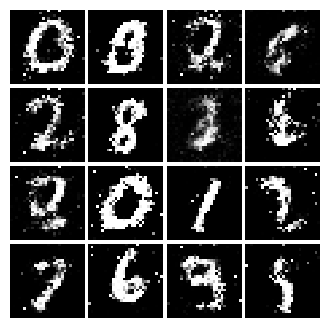

Epoch: 6, Iter: 3060, D: 0.2368, G:0.1966


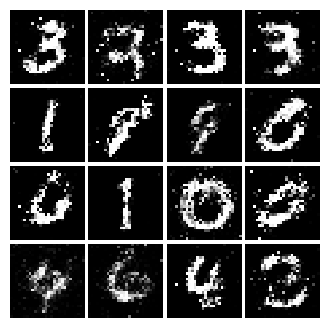

Epoch: 6, Iter: 3080, D: 0.2195, G:0.1743


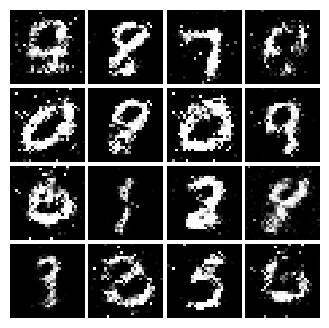

Epoch: 6, Iter: 3100, D: 0.2036, G:0.2065


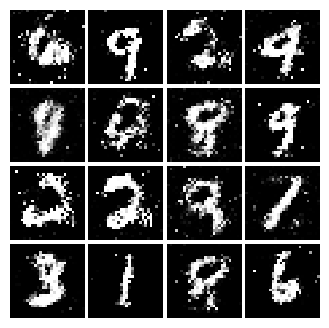

Epoch: 6, Iter: 3120, D: 0.1971, G:0.1777


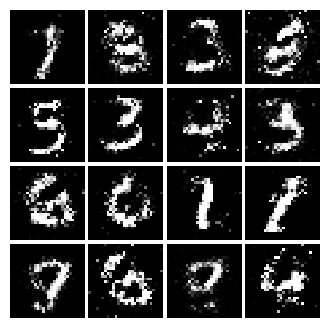

Epoch: 6, Iter: 3140, D: 0.2393, G:0.1742


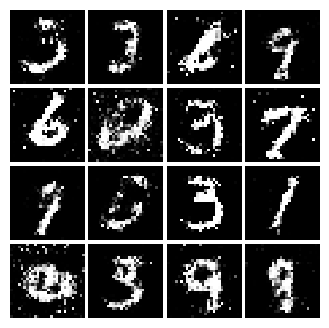

Epoch: 6, Iter: 3160, D: 0.2061, G:0.2044


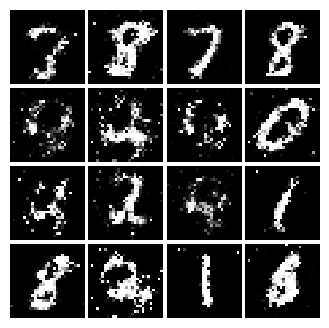

Epoch: 6, Iter: 3180, D: 0.2026, G:0.1874


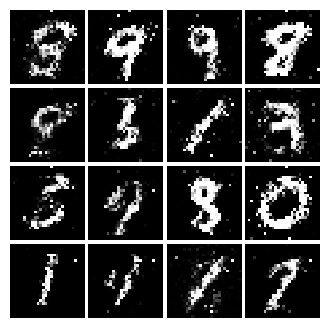

Epoch: 6, Iter: 3200, D: 0.2132, G:0.1687


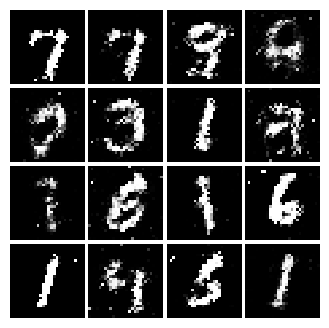

Epoch: 6, Iter: 3220, D: 0.2206, G:0.1958


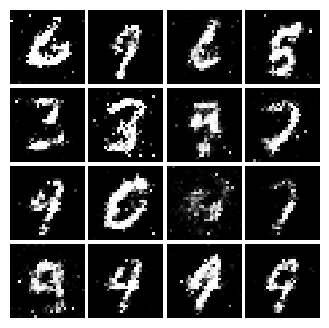

Epoch: 6, Iter: 3240, D: 0.2069, G:0.1667


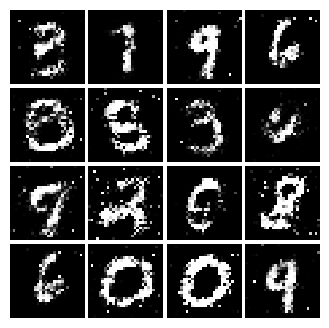

Epoch: 6, Iter: 3260, D: 0.2239, G:0.178


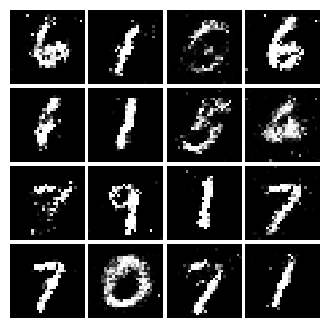

Epoch: 6, Iter: 3280, D: 0.2341, G:0.1724


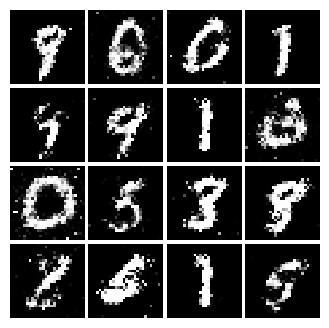

Epoch: 7, Iter: 3300, D: 0.2008, G:0.1987


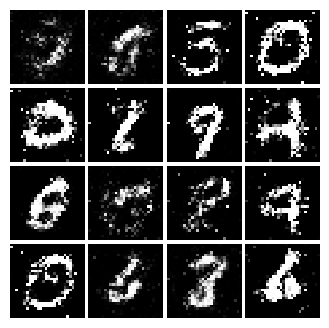

Epoch: 7, Iter: 3320, D: 0.2081, G:0.234


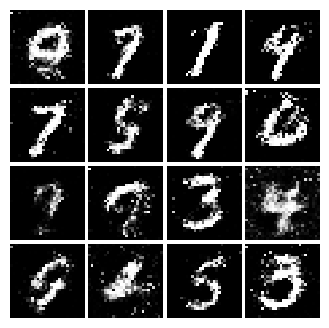

Epoch: 7, Iter: 3340, D: 0.2226, G:0.1682


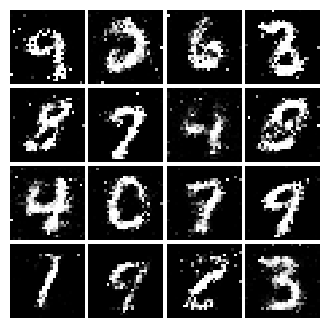

Epoch: 7, Iter: 3360, D: 0.2247, G:0.1951


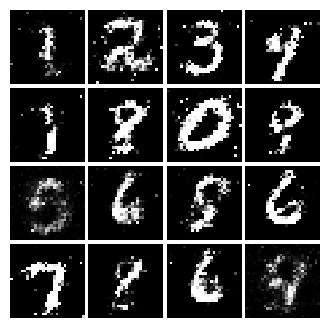

Epoch: 7, Iter: 3380, D: 0.2251, G:0.1759


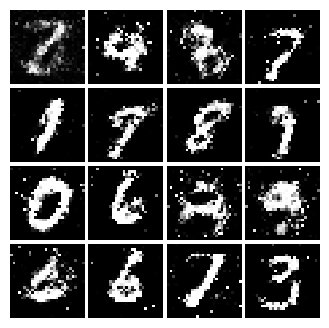

Epoch: 7, Iter: 3400, D: 0.2285, G:0.1698


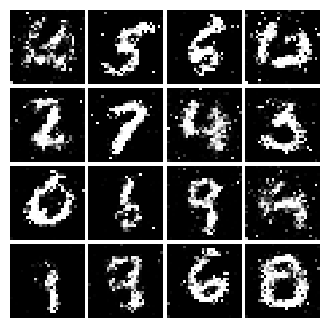

Epoch: 7, Iter: 3420, D: 0.2206, G:0.2


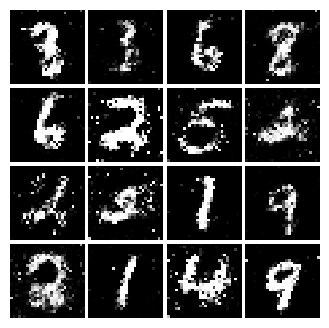

Epoch: 7, Iter: 3440, D: 0.2314, G:0.2054


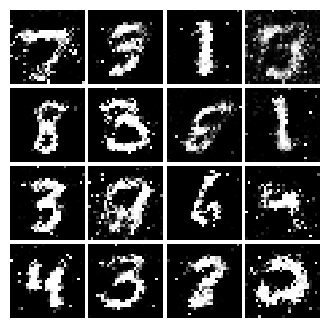

Epoch: 7, Iter: 3460, D: 0.2146, G:0.2051


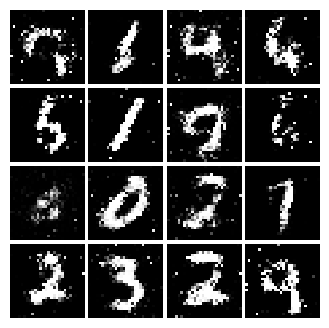

Epoch: 7, Iter: 3480, D: 0.2293, G:0.1634


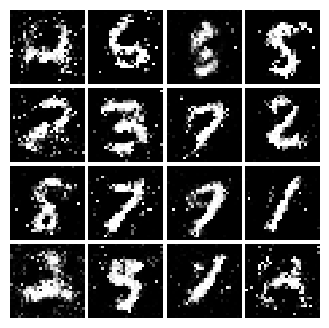

Epoch: 7, Iter: 3500, D: 0.2334, G:0.1855


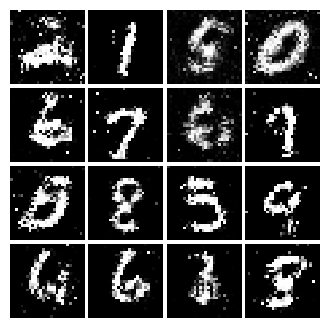

Epoch: 7, Iter: 3520, D: 0.2293, G:0.1685


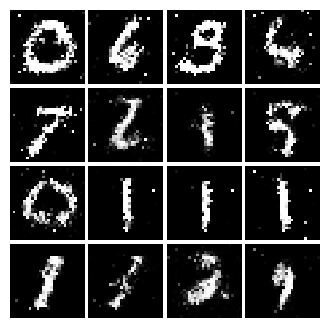

Epoch: 7, Iter: 3540, D: 0.2024, G:0.2213


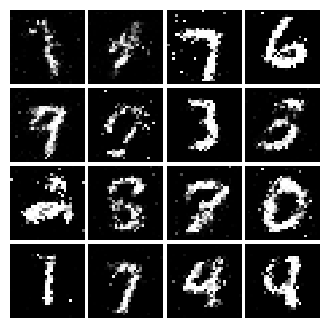

Epoch: 7, Iter: 3560, D: 0.2007, G:0.1951


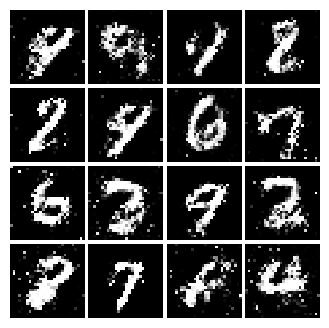

Epoch: 7, Iter: 3580, D: 0.2213, G:0.175


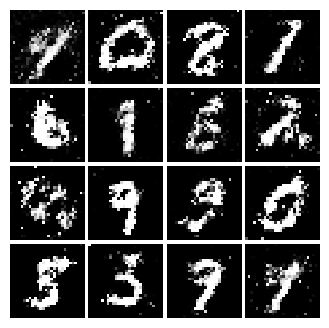

Epoch: 7, Iter: 3600, D: 0.2271, G:0.1957


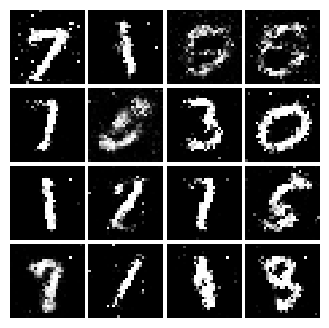

Epoch: 7, Iter: 3620, D: 0.2505, G:0.134


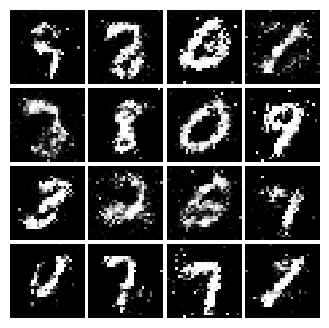

Epoch: 7, Iter: 3640, D: 0.246, G:0.1596


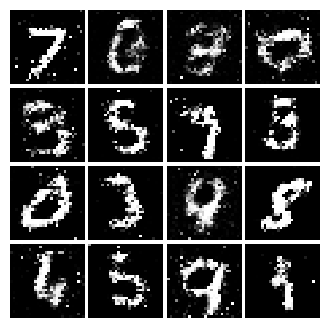

Epoch: 7, Iter: 3660, D: 0.2102, G:0.1722


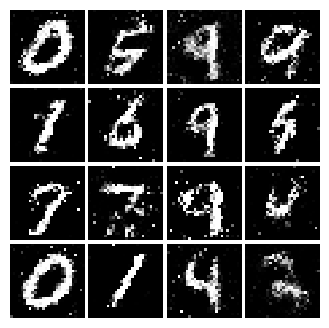

Epoch: 7, Iter: 3680, D: 0.2151, G:0.1939


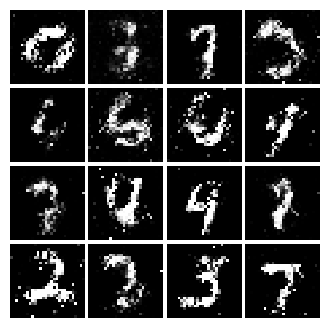

Epoch: 7, Iter: 3700, D: 0.22, G:0.1753


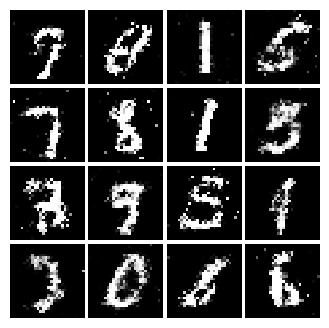

Epoch: 7, Iter: 3720, D: 0.2149, G:0.1897


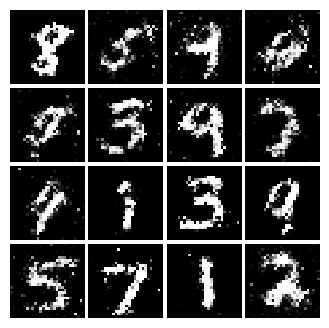

Epoch: 7, Iter: 3740, D: 0.253, G:0.1753


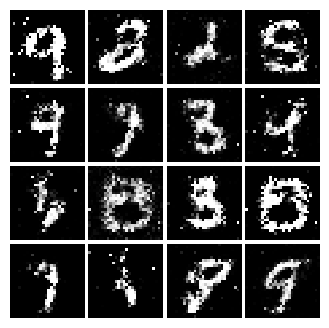

Epoch: 8, Iter: 3760, D: 0.242, G:0.179


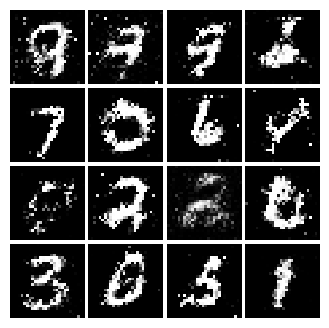

Epoch: 8, Iter: 3780, D: 0.2453, G:0.1709


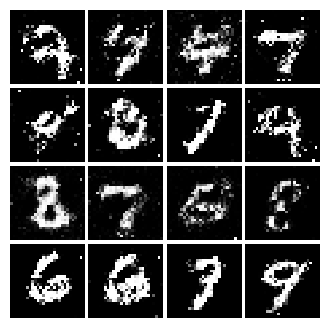

Epoch: 8, Iter: 3800, D: 0.2165, G:0.187


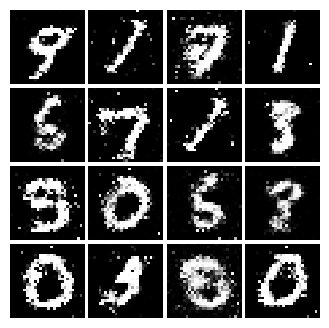

Epoch: 8, Iter: 3820, D: 0.2196, G:0.1446


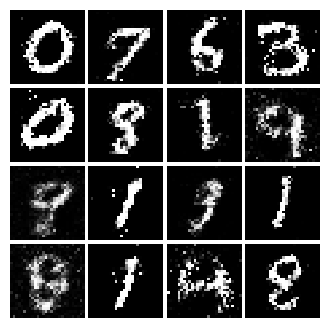

Epoch: 8, Iter: 3840, D: 0.225, G:0.1815


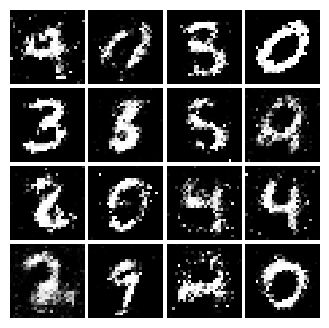

Epoch: 8, Iter: 3860, D: 0.219, G:0.158


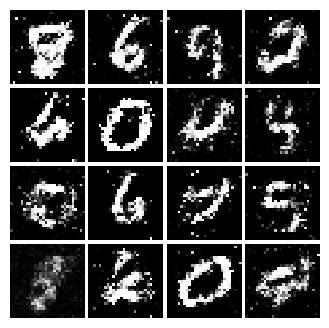

Epoch: 8, Iter: 3880, D: 0.2051, G:0.1713


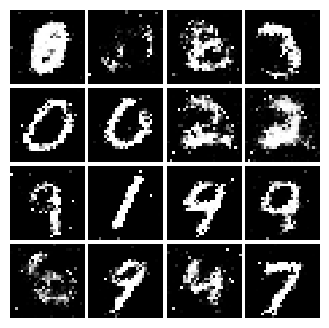

Epoch: 8, Iter: 3900, D: 0.2384, G:0.1812


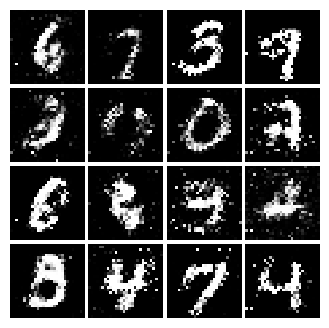

Epoch: 8, Iter: 3920, D: 0.2375, G:0.177


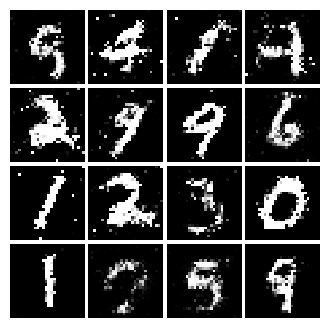

Epoch: 8, Iter: 3940, D: 0.2393, G:0.1818


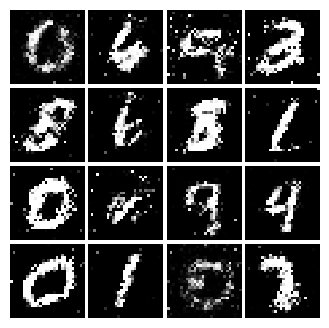

Epoch: 8, Iter: 3960, D: 0.2405, G:0.1718


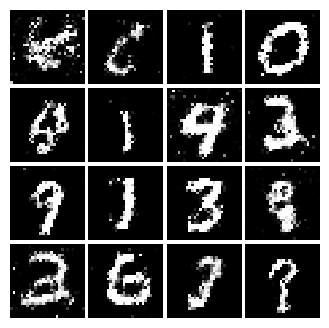

Epoch: 8, Iter: 3980, D: 0.2474, G:0.1779


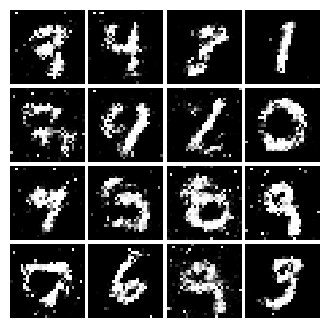

Epoch: 8, Iter: 4000, D: 0.2039, G:0.1988


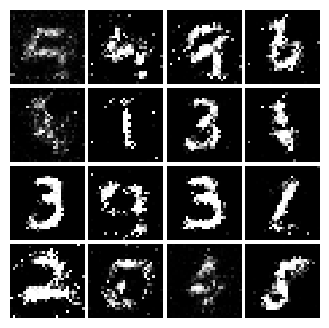

Epoch: 8, Iter: 4020, D: 0.2495, G:0.1646


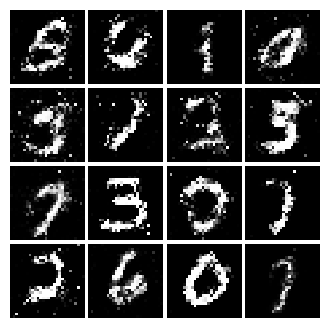

Epoch: 8, Iter: 4040, D: 0.2333, G:0.1745


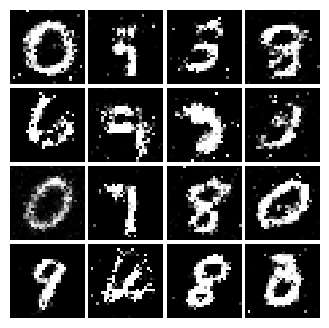

Epoch: 8, Iter: 4060, D: 0.2144, G:0.1839


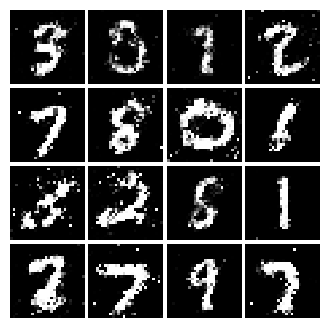

Epoch: 8, Iter: 4080, D: 0.2338, G:0.1665


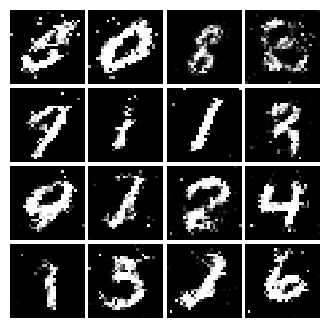

Epoch: 8, Iter: 4100, D: 0.241, G:0.1818


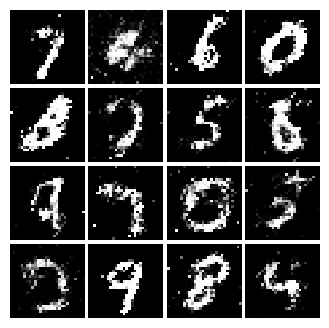

Epoch: 8, Iter: 4120, D: 0.2244, G:0.1654


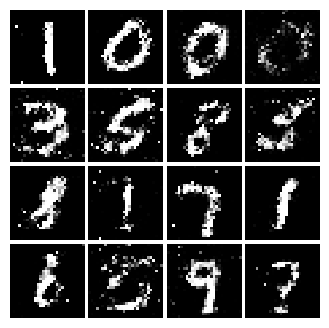

Epoch: 8, Iter: 4140, D: 0.2345, G:0.1729


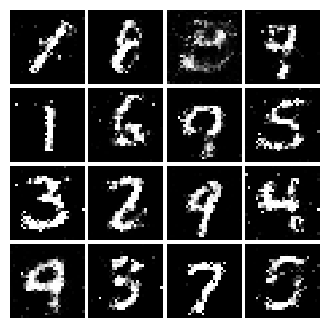

Epoch: 8, Iter: 4160, D: 0.2347, G:0.1743


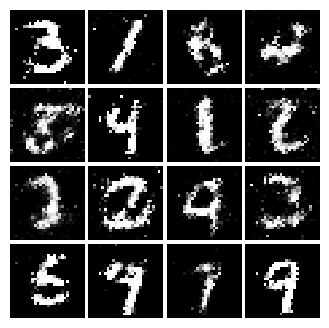

Epoch: 8, Iter: 4180, D: 0.2303, G:0.1693


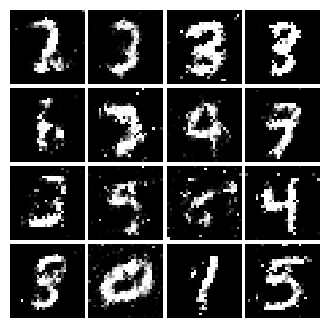

Epoch: 8, Iter: 4200, D: 0.2237, G:0.1845


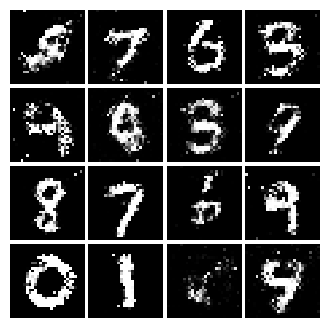

Epoch: 8, Iter: 4220, D: 0.2251, G:0.1996


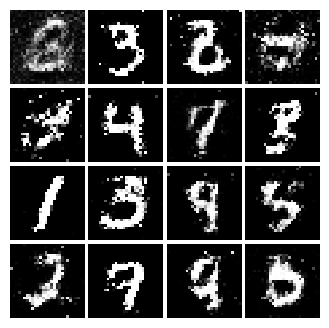

Epoch: 9, Iter: 4240, D: 0.2402, G:0.1601


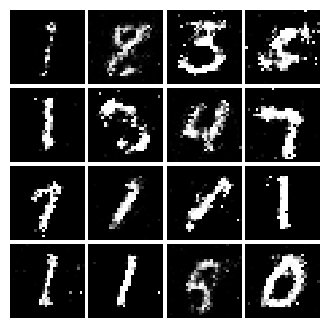

Epoch: 9, Iter: 4260, D: 0.2649, G:0.1849


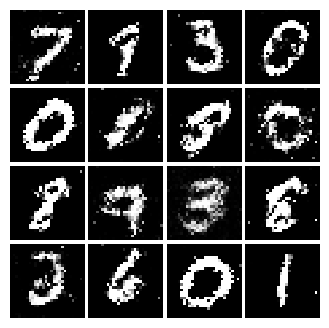

Epoch: 9, Iter: 4280, D: 0.2355, G:0.1637


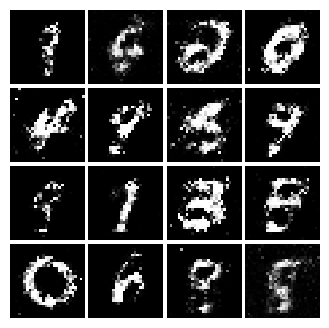

Epoch: 9, Iter: 4300, D: 0.2249, G:0.1873


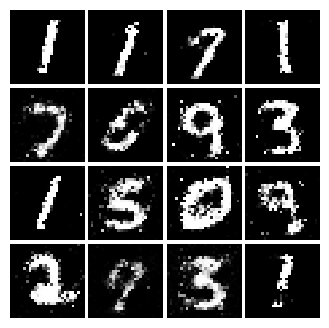

Epoch: 9, Iter: 4320, D: 0.2538, G:0.1551


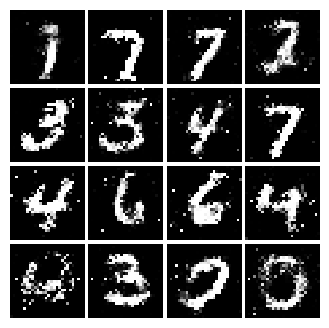

Epoch: 9, Iter: 4340, D: 0.2204, G:0.1639


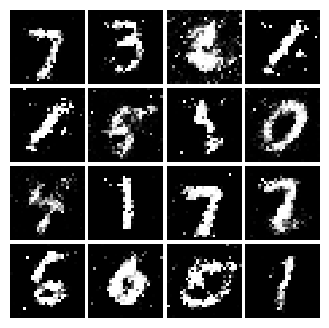

Epoch: 9, Iter: 4360, D: 0.2477, G:0.1682


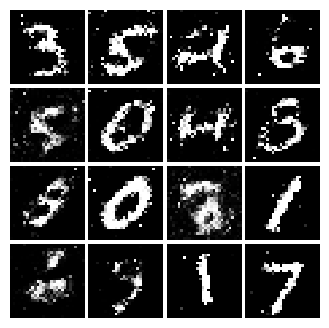

Epoch: 9, Iter: 4380, D: 0.2272, G:0.1784


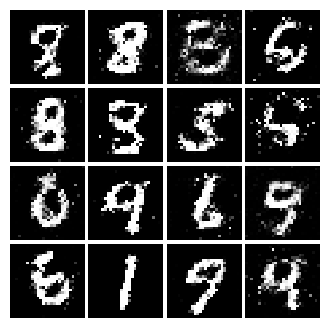

Epoch: 9, Iter: 4400, D: 0.2157, G:0.1981


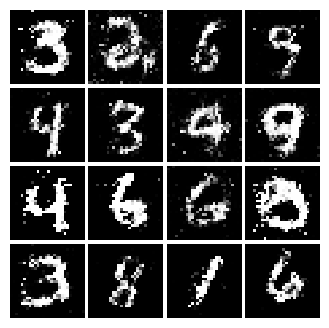

Epoch: 9, Iter: 4420, D: 0.2294, G:0.1664


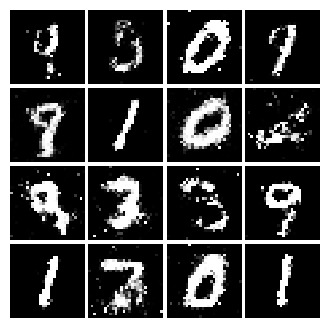

Epoch: 9, Iter: 4440, D: 0.236, G:0.1604


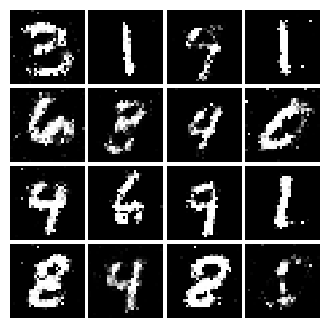

Epoch: 9, Iter: 4460, D: 0.2384, G:0.153


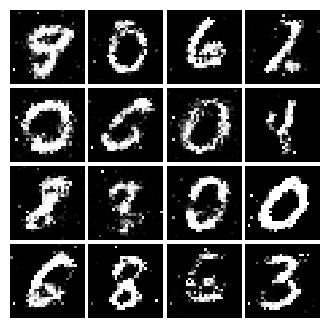

Epoch: 9, Iter: 4480, D: 0.2182, G:0.1911


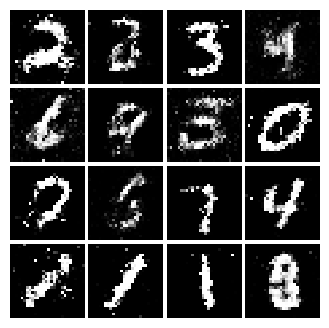

Epoch: 9, Iter: 4500, D: 0.2333, G:0.1531


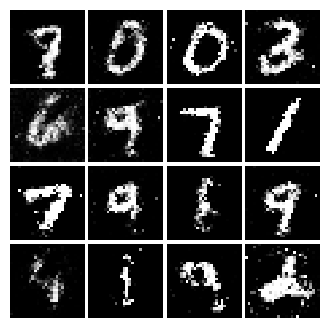

Epoch: 9, Iter: 4520, D: 0.2552, G:0.1781


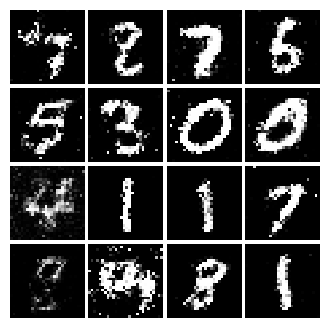

Epoch: 9, Iter: 4540, D: 0.2222, G:0.1566


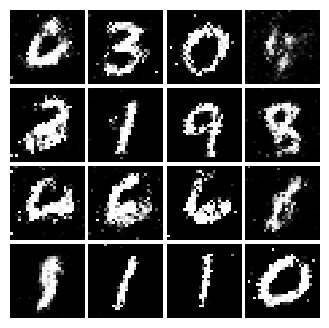

Epoch: 9, Iter: 4560, D: 0.248, G:0.2108


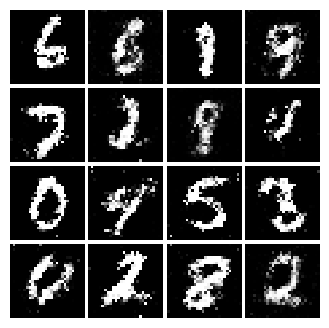

Epoch: 9, Iter: 4580, D: 0.2325, G:0.1856


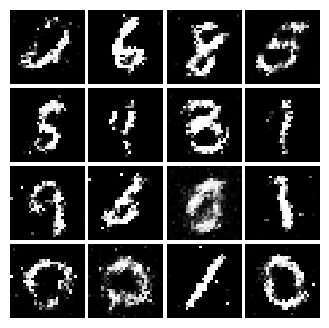

Epoch: 9, Iter: 4600, D: 0.2233, G:0.1776


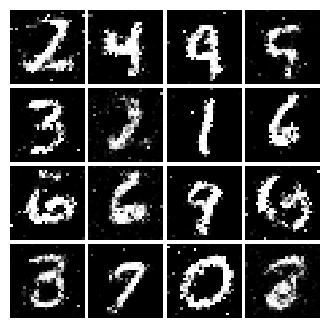

Epoch: 9, Iter: 4620, D: 0.2564, G:0.2006


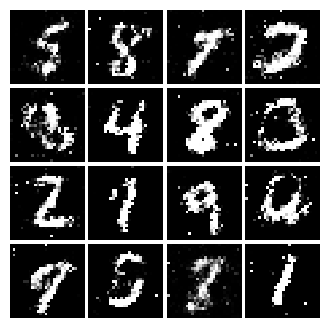

Epoch: 9, Iter: 4640, D: 0.2253, G:0.1709


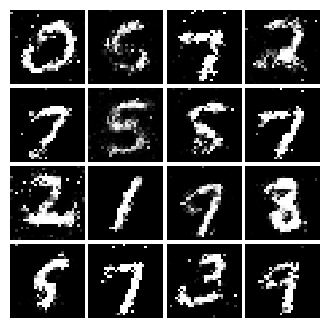

Epoch: 9, Iter: 4660, D: 0.2255, G:0.1787


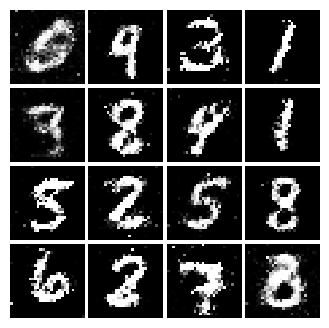

Epoch: 9, Iter: 4680, D: 0.2329, G:0.1678


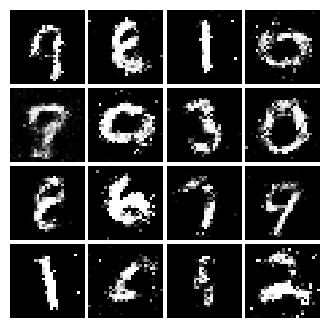

Final images


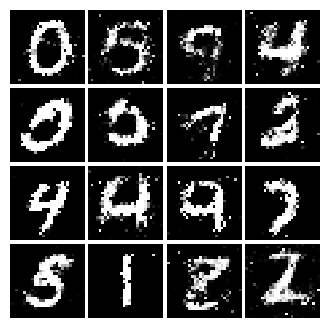

In [23]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_optimizer, G_optimizer = get_optimizers()

# Run it!
run_a_gan(D, G, D_optimizer, G_optimizer, ls_discriminator_loss, ls_generator_loss)

# Part II - Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [24]:
def discriminator():
    """Compute discriminator score for a batch of input images.

    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]

    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        ###############################################################
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        ###############################################################
        tf.keras.layers.Conv2D(32, kernel_size=5, strides=1, padding='valid', input_shape=(28, 28, 1)),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        
        # MaxPooling 2x2 with stride 2
        tf.keras.layers.MaxPooling2D(pool_size=2, strides=2),
        
        # Conv2D Layer 2: 64 filters, 5x5 kernel, stride 1, no padding
        tf.keras.layers.Conv2D(64, kernel_size=5, strides=1, padding='valid'),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        
        # MaxPooling 2x2 with stride 2
        tf.keras.layers.MaxPooling2D(pool_size=2, strides=2),
        
        # Flatten the 2D feature maps to 1D
        tf.keras.layers.Flatten(),
        
        # Fully connected layer: output size 4*4*64
        tf.keras.layers.Dense(4 * 4 * 64),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        
        # Final fully connected layer: output size 1 (score for real/fake)
        tf.keras.layers.Dense(1)

        #############################################################
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        #############################################################
    ])

    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


C:\Users\zlism\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [31]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.

    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]

    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    ###############################################################
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ###############################################################
    tf.keras.layers.Dense(1024, input_dim=noise_dim),
    tf.keras.layers.ReLU(),
    tf.keras.layers.BatchNormalization(),
    
    # Fully connected layer with 7*7*128 units (reshape later to image)
    tf.keras.layers.Dense(7 * 7 * 128),
    tf.keras.layers.ReLU(),
    tf.keras.layers.BatchNormalization(),
    
    # Reshape the output to (7, 7, 128)
    tf.keras.layers.Reshape((7, 7, 128)),
    
    # Conv2DTranspose: Upsample to 14x14 with 64 filters, kernel size 4x4, stride 2
    tf.keras.layers.Conv2DTranspose(64, kernel_size=4, strides=2, padding='same'),
    tf.keras.layers.ReLU(),
    tf.keras.layers.BatchNormalization(),
    
    # Conv2DTranspose: Upsample to 28x28 with 1 filter, kernel size 4x4, stride 2
    tf.keras.layers.Conv2DTranspose(1, kernel_size=4, strides=2, padding='same'),
    
    # Final output layer with Tanh activation to scale the output to [-1, 1]
    tf.keras.layers.Activation('tanh')

        
    ])
    #############################################################
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    #############################################################
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

In [ ]:
def preprocess_img(x):
    """
    Preprocesses the input images by reshaping and scaling pixel values.

    Inputs:
    - x: A TensorFlow Tensor of shape (batch_size, 784).

    Returns:
    - A TensorFlow Tensor of shape (batch_size, 28, 28, 1), with pixel values
      scaled to the range [-1, 1].
    """
    x = tf.reshape(x, [-1, 28, 28, 1])  # Reshape to 28x28x1
    x = x * 2.0 - 1.0  # Scale to range [-1, 1]
    return x

In [32]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_optimizer, G_optimizer = get_optimizers()

# Run it!
run_a_gan(D, G, D_optimizer, G_optimizer, discriminator_loss, generator_loss, num_epochs=3)

ValueError: Exception encountered when calling Sequential.call().

[1mInvalid input shape for input [[-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 ...
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]]. Expected shape (None, 28, 28, 1), but input has incompatible shape (128, 784)[0m

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=(128, 784), dtype=float32)
  • training=None
  • mask=None

# OPTIONAL: Part III - Sequence-to-Sequence Generative Model

Research and experiment on architecture and training of a sequence-to-sequence autoencoders and generative model for task such as language translation. Below are example tutorials:

- https://keras.io/examples/nlp/lstm_seq2seq/
- https://keras.io/examples/nlp/neural_machine_translation_with_transformer/